In [1]:
import pandas as pd # For data manipulation
import numpy as np # For numerical calculations
import matplotlib.pyplot as plt # For plotting
import seaborn as sns # For plotting
import matplotlib.patches as patches # For plotting some pre defined shaped
import matplotlib # For general purpose plotting
import scipy # For some other complex numerical calculations
import scipy.signal # For filtering the data
import tsfel # For feature extraction
plt.style.use(["science", "notebook","grid"])
pd.set_option("display.max_columns", 1000)

# Print the versions of the modules used
print("pandas version: ", pd.__version__)
print("numpy version: ", np.__version__)
print("matplotlib version: ", matplotlib.__version__)
print("seaborn version: ", sns.__version__)
print("Scipy version: ", scipy.__version__)

pandas version:  1.5.3
numpy version:  1.23.5
matplotlib version:  3.7.1
seaborn version:  0.12.2
Scipy version:  1.10.1


- Number of Samples: 109446
- Number of Categories: 5
- Sampling Frequency: 125Hz
- Data Source: Physionet's MIT-BIH Arrhythmia Dataset
- Classes: 
` ['N': 0, 'S': 1, 'V': 2, 'F': 3, 'Q': 4] `

In [2]:
mit_data = pd.read_csv("/Users/archismanchakraborti/Desktop/python files/Dissertation/archive/mitbih_train.csv",
                       header=None)
mit_data_test = pd.read_csv("/Users/archismanchakraborti/Desktop/python files/Dissertation/archive/mitbih_test.csv", 
                header=None)
mit_data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187
0,0.977941,0.926471,0.681373,0.245098,0.154412,0.191176,0.151961,0.085784,0.058824,0.049020,0.044118,0.061275,0.066176,0.061275,0.049020,0.073529,0.061275,0.061275,0.066176,0.068627,0.095588,0.075980,0.093137,0.105392,0.115196,0.102941,0.117647,0.125000,0.142157,0.127451,0.151961,0.144608,0.164216,0.144608,0.159314,0.151961,0.154412,0.142157,0.151961,0.151961,0.147059,0.132353,0.127451,0.134804,0.137255,0.112745,0.107843,0.105392,0.107843,0.098039,0.093137,0.102941,0.100490,0.105392,0.102941,0.117647,0.105392,0.122549,0.127451,0.142157,0.147059,0.144608,0.174020,0.230392,0.237745,0.247549,0.230392,0.225490,0.198529,0.176471,0.132353,0.125000,0.117647,0.122549,0.112745,0.129902,0.115196,0.083333,0.000000,0.066176,0.306373,0.612745,0.860294,1.000000,0.958333,0.745098,0.303922,0.164216,0.205882,0.164216,0.102941,0.095588,0.090686,0.100490,0.095588,0.098039,0.093137,0.098039,0.095588,0.112745,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.960114,0.863248,0.461538,0.196581,0.094017,0.125356,0.099715,0.088319,0.074074,0.082621,0.074074,0.062678,0.065527,0.065527,0.062678,0.076923,0.071225,0.082621,0.091168,0.096866,0.082621,0.082621,0.091168,0.105413,0.122507,0.148148,0.182336,0.193732,0.213675,0.207977,0.222222,0.253561,0.270655,0.287749,0.284900,0.293447,0.256410,0.247863,0.188034,0.145299,0.108262,0.082621,0.079772,0.074074,0.014245,0.011396,0.062678,0.051282,0.056980,0.048433,0.028490,0.031339,0.076923,0.025641,0.028490,0.037037,0.094017,0.085470,0.039886,0.059829,0.074074,0.079772,0.091168,0.099715,0.108262,0.088319,0.091168,0.065527,0.085470,0.088319,0.076923,0.082621,0.096866,0.099715,0.133903,0.102564,0.039886,0.065527,0.074074,0.082621,0.085470,0.056980,0.045584,0.102564,0.039886,0.011396,0.017094,0.031339,0.005698,0.008547,0.031339,0.051282,0.056980,0.088319,0.065527,0.011396,0.056980,0.039886,0.039886,0.025641,0.002849,0.019943,0.025641,0.011396,0.028490,0.019943,0.022792,0.034188,0.014245,0.051282,0.068376,0.139601,0.287749,0.527066,0.777778,1.000000,0.888889,0.492877,0.190883,0.088319,0.062678,0.034188,0.00000,0.034188,0.017094,0.002849,0.000000,0.048433,0.048433,0.054131,0.042735,0.054131,0.059829,0.062678,0.071225,0.076923,0.099715,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.000000,0.659459,0.186486,0.070270,0.070270,0.059459,0.056757,0.043243,0.054054,0.045946,0.056757,0.043243,0.067568,0.062162,0.078378,0.072973,0.086486,0.081081,0.108108,0.110811,0.135135,0.135135,0.170270,0.183784,0.216216,0.237838,0.270270,0.286486,0.316216,0.318919,0.332432,0.297297,0.267568,0.216216,0.189189,0.132432,0.118919,0.064865,0.064865,0.043243,0.054054,0.037838,0.043243,0.021622,0.045946,0.035135,0.056757,0.035135,0.037838,0.032432

A preliminary first glance at the data shows that the last 30-40 columns have mostly zero values in them. But, we will not be dropping them as they might be important for the model and may be an important part of the ECG itself.
Anyway, even if they are not, they should not be a problem as the main features of the data will be before them.

Let's see some basic features of the data like
- description 
- info
- the shape 
- number of null values for the data
- Number of individual entries for each class in the data

In [3]:
mit_data.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187
count,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000,87554.000000
mean,0.890360,0.758160,0.423972,0.219104,0.201127,0.210399,0.205808,0.201773,0.198691,0.196757,0.198778,0.203550,0.208776,0.212885,0.218393,0.224966,0.231377,0.237123,0.242582,0.247923,0.253749,0.259748,0.266244,0.272734,0.279355,0.285588,0.291808,0.297672,0.303384,0.308795,0.313890,0.318454,0.322087,0.324891,0.326737,0.327817,0.327931,0.326746,0.324326,0.320537,0.316234,0.311407,0.306520,0.301696,0.297087,0.292225,0.287838,0.283965,0.280724,0.278051,0.276432,0.275132,0.274152,0.273004,0.272354,0.271696,0.271413,0.271276,0.271590,0.272307,0.273436,0.274492,0.275570,0.276823,0.278993,0.281349,0.282139,0.280225,0.276547,0.272064,0.268006,0.264239,0.260910,0.257082,0.254712,0.254155,0.255646,0.257813,0.259830,0.259958,0.258528,0.256549,0.255682,0.254850,0.253470,0.251946,0.250425,0.247326,0.241640,0.234124,0.226143,0.218646,0.212149,0.207332,0.204524,0.202845,0.201995,0.201829,0.201814,0.200801,0.

- Though this description is not very useful, it gives us a basic idea of the data.  
- However, a basic flaw in thi description is it aggregates over the columns(the features) and not the rows(the samples-individual ECGs).  
- We will deal with by using individual functions with axis = 1 later.
- However, we won't use the last column as it is the class label.

In [4]:
mit_data.drop(columns = [187]).agg(['mean', "std", "count"], axis = 1)

,mean,std,count
0,0.098419,0.176545,187.0
1,0.090010,0.160151,187.0
2,0.062104,0.139142,187.0
3,0.084084,0.161252,187.0
4,0.116567,0.186651,187.0
...,...,...,...
87549,0.158364,0.169925,187.0
87550,0.325508,0.293708,187.0
87551,0.316665,0.275855,187.0
87552,0.101807,0.161769,187.0


The above description is more insigtful as it shows the parameter for every individual sample(ECG).

In [5]:
mit_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87554 entries, 0 to 87553
Columns: 188 entries, 0 to 187
dtypes: float64(188)
memory usage: 125.6 MB


In [6]:
print(f"Shape of MIT TRAIN data = {mit_data.shape}", end = '\n\n')
print(f"Number of unique classes = {len(mit_data[187].unique())}", end = '\n\n')
print(f"Number of samples per class = \n {mit_data[187].value_counts()}", end = '\n\n')
print(f"Number of NAN values = {mit_data.isna().sum().sum()}", end = '\n\n')
print(f"Number of NULL values = {mit_data.isnull().sum().sum()}")

Shape of MIT TRAIN data = (87554, 188)

Number of unique classes = 5

Number of samples per class = 
 0.0    72471
4.0     6431
2.0     5788
1.0     2223
3.0      641
Name: 187, dtype: int64

Number of NAN values = 0

Number of NULL values = 0


- Seems like there are no null values in the data
- There are no NAN values in the data as well
- We will not drop any duplicated rows even if there are any as these are all individual samples

#### Let us make another column in the data to display the actual condition of the patient instead of a number for the class. The diseases corresponding to each number can be found at the beginning of this notebook and in the dataset description.

In [7]:
# Training data
mit_data["Condition"] = mit_data[187].replace({0: "N",
                        1:"S",
                        2:"V",
                        3:"F",
                        4:"Q"}).astype("category")

# Testing data
mit_data_test["Condition"] = mit_data_test[187].replace({0: "N",
                        1:"S",
                        2:"V",
                        3:"F",
                        4:"Q"}).astype("category")

We will use all columns other than the last 2 columns where there are labels for individual ECG Records

Text(0.5, 0, 'Mean value')

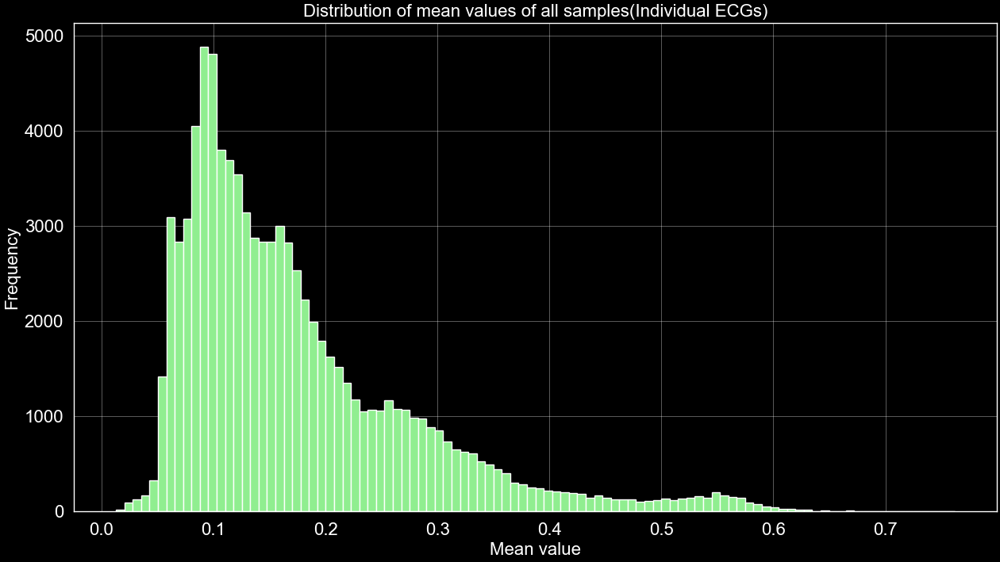

In [8]:
sns.set_style("darkgrid")
plt.style.use(["dark_background"])
ax = mit_data.drop(columns = [187, "Condition"])\
    .mean(axis = 1).plot(kind = "hist", bins = 100, figsize = (15, 8),
                                          title = "Distribution of mean values of all samples(Individual ECGs)",
                                           ylabel = "Frequency", color = 'LightGreen')
ax.set_xlabel("Mean value")

Most of the means of the ECGs lie in the range of 0 to 0.2.
It may be  interesting to see:
- How many ECGs have a mean value greater than 0.2?
- How many ECGs have a mean value less than 0.2?
- The distribution of diseases vs the mean value of ECGs

In [9]:
print(f"""Percentage of ECGs with mean above 0.2 = 
        {(mit_data.drop(columns=[187, "Condition"]).mean(axis = 1) > 0.2).sum() / len(mit_data) * 100:.2f}%""")
print(f"""Percentage of ECGs with mean less than 0.2 =
        {(mit_data.drop(columns=[187, "Condition"]).mean(axis = 1) < 0.2).sum() / len(mit_data) * 100:.2f}%""") 

Percentage of ECGs with mean above 0.2 = 
        29.25%
Percentage of ECGs with mean less than 0.2 =
        70.75%


As expected, most of the data lies in the range of 0 to 0.2.

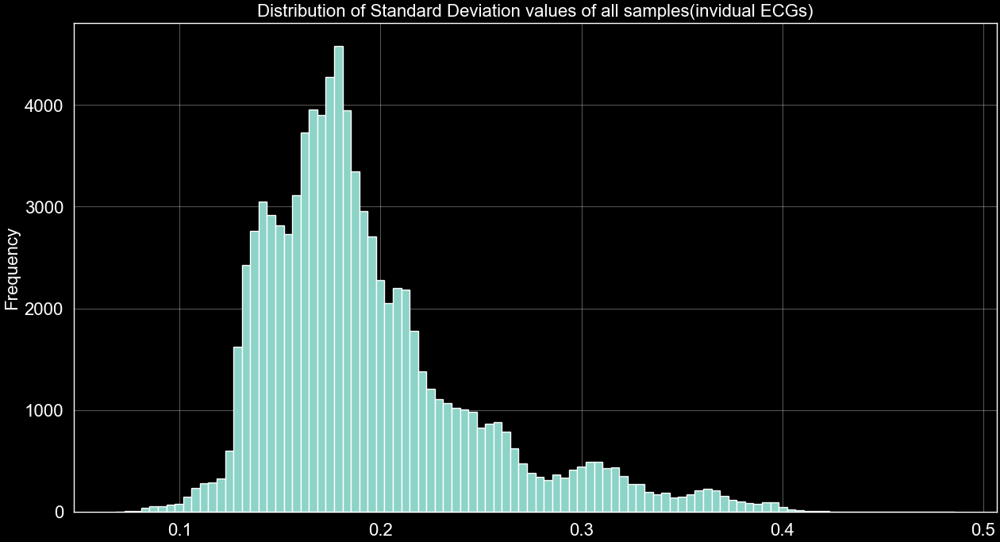

In [10]:
sns.set_style("darkgrid")
plt.style.use(["dark_background"])
mit_data.drop(columns = [187, "Condition"])\
    .std(axis = 1).plot(kind="hist", bins = 100, figsize=(15, 8), 
    title = "Distribution of Standard Deviation values of all samples(invidual ECGs)");

Standard Deviation of the ECGs lie in the range of 0.1 to 0.25, which is a good sign. It means that the ECGs are not too noisy. We might need to apply some noise reduction techniques to the ECGs. But, we will see that later.
There is a slight bump in the standard deviation at 0.3. It may be due to an individual disease which we may investigate later.

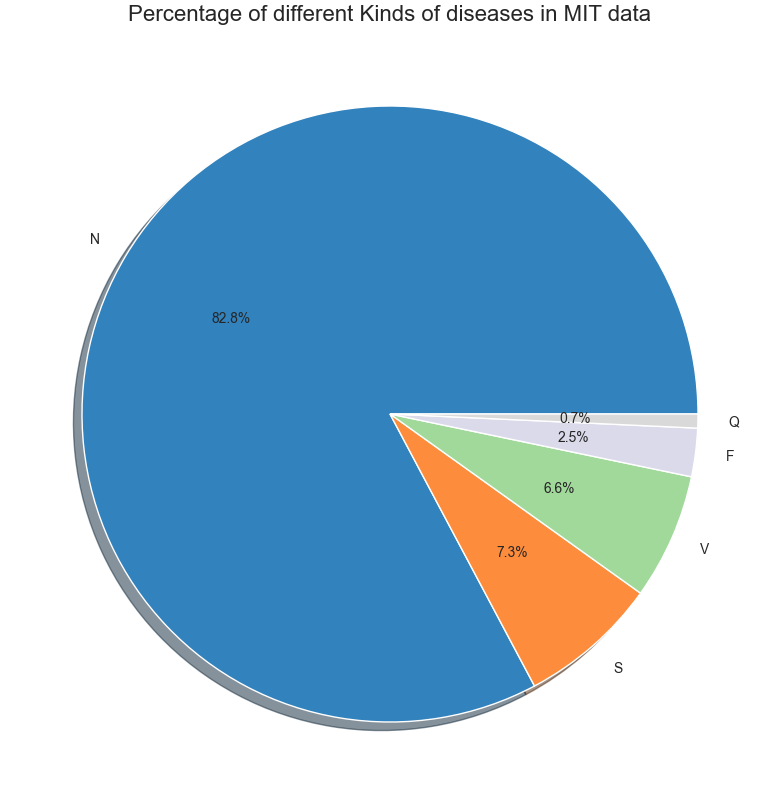

In [11]:
sns.set_style("darkgrid")

mit_data[187].value_counts().plot(kind="pie", figsize = (15, 10), shadow = True,
                                labels = mit_data["Condition"].unique(),
                                  autopct = '%1.1f%%', fontsize = 10, ylabel = "",
                                  title = "Percentage of different Kinds of diseases in MIT data",
                                  colormap = "tab20c");

It looks like that data "N" is the most prevelant. Let's see some more distributions.
- The data is not truly balanced as there are a huge number of "N" samples.
- We will create the model and see the results first and then if need arises, we may balance the data
- However, as the dataset is fairly large, we may not need to balance the data
- The least most prevetant data is "Q" which may be a rare disease.
- Such a distribution of data may point to the relative rarity of the diseases

### No we wish to see data means and standard deviations for each type of disease

In [12]:
# Mean data
means = mit_data.drop(columns = [187]).mean(numeric_only = True, axis = 1)
stds = mit_data.drop(columns = [187]).std(numeric_only = True, axis = 1)

# labels
labels = mit_data["Condition"].values

# Create dataframe with mean datas and labels
df = pd.DataFrame({"mean": means, "std": stds, "label": labels})

Text(0.5, 1.0, 'Standard deviation of ECGs for different conditions')

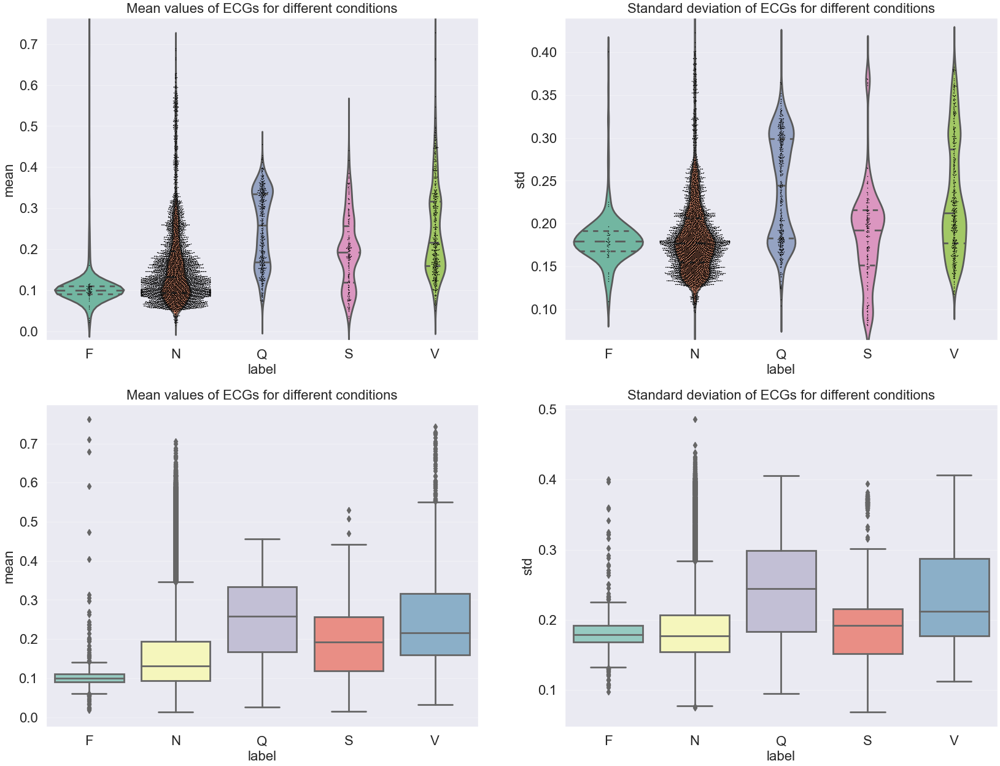

In [13]:
sns.set_style("darkgrid")

fig, ax  = plt.subplots(2, 2, figsize = (20, 15))
ax1, ax2, ax3, ax4 = ax.ravel()

sns.violinplot(data = df, x = "label", y = "mean", inner = "quartile", palette = "Set2", ax = ax1)
sns.swarmplot(data = df.sample(frac=0.08), x = "label", y = "mean", color = "black", size = 1, ax = ax1)
ax1.set_title("Mean values of ECGs for different conditions")

sns.violinplot(data = df, x = "label", y = "std", inner = "quartile", palette = "Set2", ax = ax2)
sns.swarmplot(data = df.sample(frac=0.08), x = "label", y = "std", color = "black", size = 1, ax = ax2)
ax2.set_title("Standard deviation of ECGs for different conditions")

sns.boxplot(data = df, x = "label", y = "mean", ax = ax3)
ax3.set_title("Mean values of ECGs for different conditions")

sns.boxplot(data = df, x = "label", y = "std", ax = ax4)
ax4.set_title("Standard deviation of ECGs for different conditions")

- We see that the mean values of the ECGs for each disease are not very different from each other.
- The shape of the boxplot and violin plot is very unique for "F" in the mean value plots.
It has a very low deviation in its mean value for individual ECGs.
- The shape of the boxplot and violin plot is very unique for "F" in the standard deviation plot as well.
There is very less deviation in the values of standard deviation for individual ECGs having "F" as the disease.
- There are a lot of outliers in the standard deviation plot for "N". This may be due to the fact that there are a lot of "N" samples in the data and the disease is not very rare or they may pose some problem later in the model.
- F also has some outliers but not too much and mostly on the higher side. 
- The standard deviation of most of the data is quite low overall hovering in the 0.2-0.3 rang which is a good sign ans shows uniformity in the ECG samples.
- It may have been useful to plot a swarm plot on the whole dataset as well but there are too many samples and it would have been very difficult to see the swarm plot. So, we have used a subset of the data for the swarm plot having 8 % of the data.
- As expected, "N" has some outliers and a lot of data.
- However, "S" also has some outliers as well.

### Let us see the ECGs for each kind of disease

First let us see 1 ECG for each disease individually and collectively

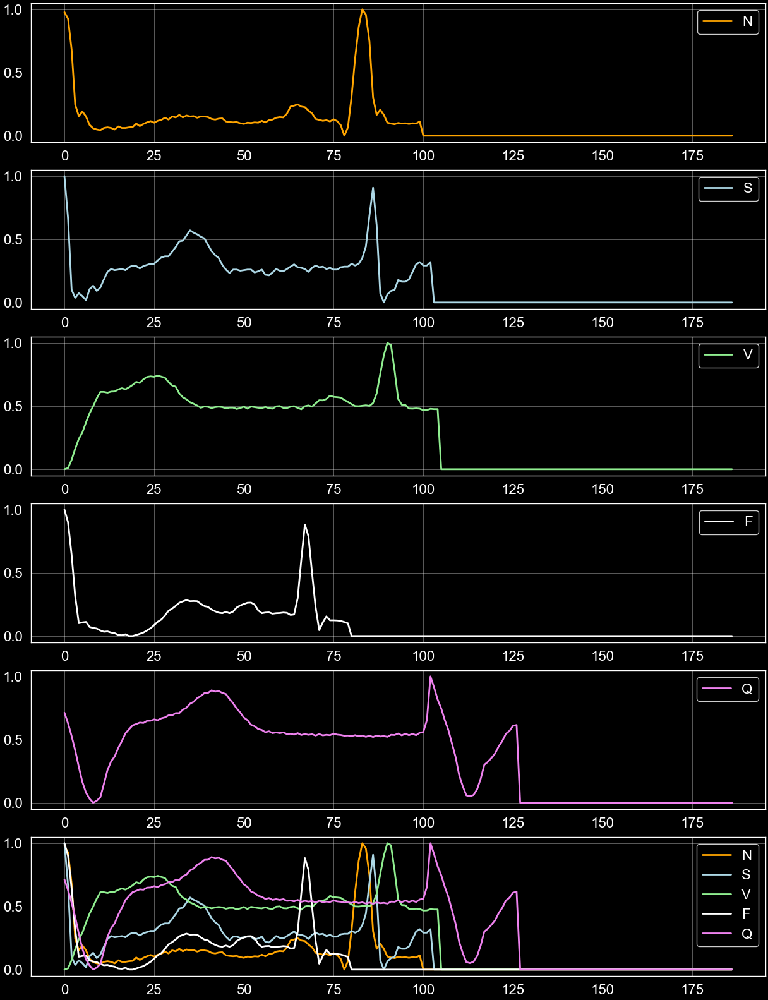

In [14]:
plt.style.use(["dark_background"])

conditions = ['N', 'S', 'V', 'F', 'Q']
colors = ["orange", "lightblue", "lightgreen", "white", "violet"]
fig, ax = plt.subplots(len(conditions)+1, 1, figsize = (15, 20))
axes = ax.ravel()

for condn, axi, color in zip(conditions, ax.ravel(), colors):
    # Plot the individual ECGs
    # Obviosuly, we drop the last 2 label columns
    axi.plot(mit_data.query(f"Condition == '{condn}'").iloc[0, :-2], color = color,
            label = f"{condn}")
    axi.legend()
    # Plot the collective ECGs
    # Here, we drop the last 2 label columns as well
    axes[-1].plot(mit_data.query(f"Condition == '{condn}'").iloc[0, :-2], color = color,
            label = f"{condn}")
    axes[-1].legend()


- Though these plots are uninterseting to look at, the last plot is of particular interest. The last plot shows a good comparison between the ECGs of the different diseases. We can see that the ECGs of the different diseases are quite different from each other.   

- Maybe, we should see this a little better by plotting the ECGs of the different diseases on the same plot.  
It may give us a better idea of how the ECGs of the different diseases are different from each other and the peaks and features in the plots which actually contribute to the classification of the ECGs.  

- Maybe, we can see all the ECGs together as well and see how the "ensemble" of the distribution of the ECGs of the different diseases look like and if there are any distinct features which can be used to classify the ECGs.  

- This may be useful in filtering out the unwanted noise in the ECGs which are not of any use to us and keep only those features (may be peaks/valleys) which are useful for classification.  

- We may as well create a model for the unfiltered data as well and see how it performs with respect to a model trained on the filtered data.

Let us now create dataframes for individual diseases and see how the ECGs look like for each disease and get a general idea of the ECGs for each disease and the peaks of the ECGs for each disease.  
We will drop the label column `187` and the `Condition` column as they are not useful for us because we are making dataframes for indivual diseases.

In [15]:
N_condition = mit_data.query("Condition == 'N'").drop(columns = [187, "Condition"]).values
S_condition = mit_data.query("Condition == 'S'").drop(columns = [187, "Condition"]).values
V_condition = mit_data.query("Condition == 'V'").drop(columns = [187, "Condition"]).values
F_condition = mit_data.query("Condition == 'F'").drop(columns = [187, "Condition"]).values
Q_condition = mit_data.query("Condition == 'Q'").drop(columns = [187, "Condition"]).values

#### We can see a huge distinct peak in the ECGs of the different diseases. Maybe, creating a box on this peak and and seeing how the box varies for the ECGs of the different diseases may give us a better idea of how the ECGs of the different diseases are different from each other.

- To find the peaks we shall exclude a little bit of the data from the beginning and the end of the ECGs. This is because the peaks are not always at the beginning and the end of the ECGs. So, we shall exclude a little bit of the data from the beginning and the end of the ECGs.
- As discussed before, aprroximately, last 30 rows had null values in them. So, we will exclude approximately the last 30 rows from the ECGs. This should give us a good prominent central peak.

### Let us define a function which will find the main peak in the ECGs and and plot a line for the peak which may be useful to see the distribution of the peaks for the ECGs of the different diseases.
We will use the `find_peaks` function from the `scipy.signal` module to find the peaks in the ECGs.

In [16]:
from scipy.signal import find_peaks

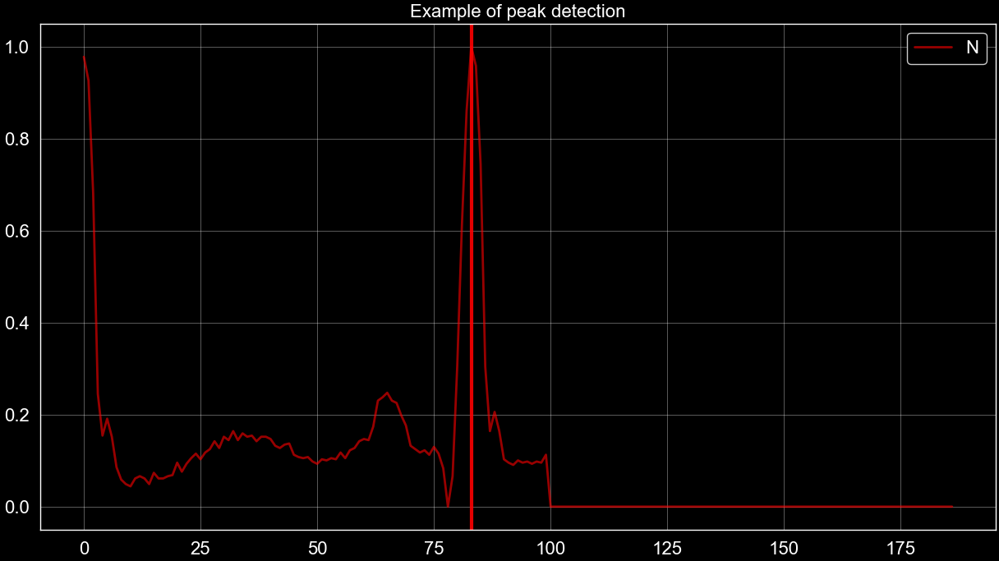

In [17]:
def find_peak(data, color,  ax = None, peak_ht :float=0.8, 
                 distance:int=15, alpha_box:float=0.2, 
                alpha_line:float=0.0, linewidth = 3, label = None)-> plt.Axes:
    """ Find peaks in ECG data and draw a box around it with the ECG data
    Args:
        data (np.array): ECG data
        color (str): Color of the box
        ax (plt.Axes): Axis to plot the data
        peak_ht (float): Height of the peak
        distance (int): Minimum distance between peaks
        alpha_box (float): Transparency of the box
        alpha_line (float): Transparency of the data line
        linewidth (int): Width of the line
        label (str): Label of the data
    Returns:
        peak (np.array): Array of peak indices
        _ (np.array): Height of Peak (Always 1)"""
    peak, _ = find_peaks(data, height = peak_ht, distance = distance)

    if ax is None:
        if (len(peak) == 1):
            plt.axvline(x=peak[0], color = color, alpha = alpha_box, lw = linewidth)
        plt.plot(data, alpha = alpha_line, color = color, label = label)
        plt.legend()
    else:
        if (len(peak) == 1):
            ax.axvline(x=peak[0], ymin=0,color = color, alpha = alpha_box, lw = linewidth)
        ax.plot(data, alpha = alpha_line, color = color, label = label)

# Example output
plt.figure(figsize = (15, 8))

find_peak(N_condition[0], "red", peak_ht = 0.8, 
            distance = 15, alpha_box = 0.9, 
            alpha_line = 0.6, linewidth = 3, label = "N")
plt.title("Example of peak detection");

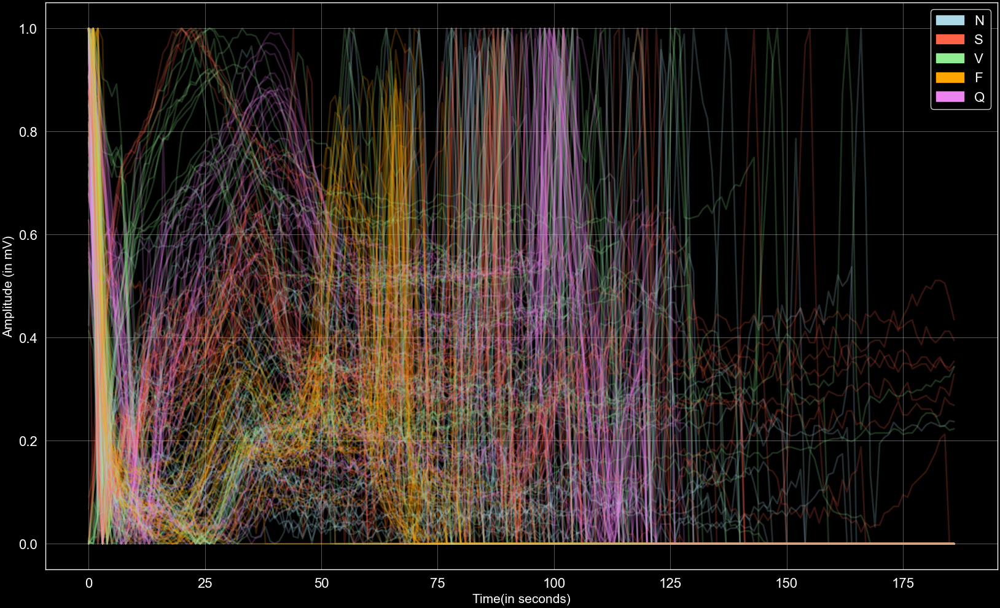

In [18]:
# Plot all Ecgs for each condition in a single plot
plt.style.use(["dark_background"])
plt.figure(figsize = (20, 12))
LIMIT = 50
for idx in range(LIMIT): 
    # Plot all ECGs
    plt.plot(N_condition[idx,:], color = "lightblue", label = "N", alpha = 0.2);
    plt.plot(S_condition[idx,:], color = "tomato", label = "S", alpha = 0.2);
    plt.plot(V_condition[idx,:], color = "lightgreen", label = "V", alpha = 0.2);
    plt.plot(F_condition[idx,:], color = "orange", label = "F", alpha = 0.2);
    plt.plot(Q_condition[idx,:], color = "violet", label = "Q", alpha = 0.2);

# Set the legend
blue_patch = patches.Patch(color='lightblue', label='N')
red_patch = patches.Patch(color='tomato', label='S')
green_patch = patches.Patch(color='lightgreen', label='V')
orange_patch = patches.Patch(color='orange', label='F')
purple_patch = patches.Patch(color='violet', label='Q')

plt.xlabel("Time(in seconds)", fontsize = 15)
plt.ylabel("Amplitude (in mV)", fontsize = 15)

plt.legend(handles=[blue_patch, red_patch, green_patch, orange_patch, purple_patch])

- The above plot may be very crowded(though, we have just plotted the first 50 ECGs for each disease). 
- However, it shows us a somewhat of a difference in the distributions of the ECGs for different conditions. 
- It may be useful to further analyse all the ECGs as a whole for each disease and see how different features of the ECGs are different for the different diseases. 

### Now, we will plot the highest peak for each condition to see the how the peaks are distributed

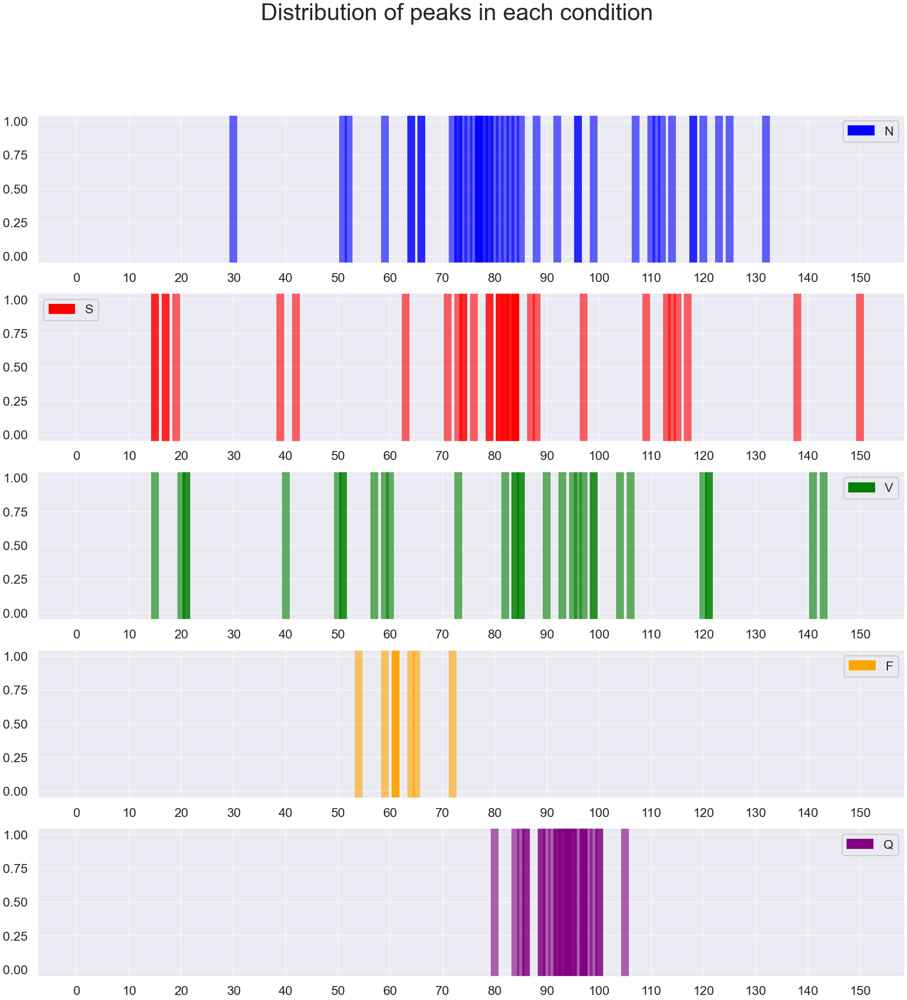

In [19]:
sns.set_theme(context = "talk", style = "darkgrid", palette = "deep", 
        font = "sans-serif", font_scale = 1, color_codes = True, rc = None)
fig, ax = plt.subplots(5, 1, figsize = (20, 20))
ax1, ax2, ax3, ax4, ax5 = ax.ravel()

for ax in ax.ravel():
  ax.set_xticks(np.linspace(0, 200, 21))

# Hyperparameters
PEAK_HT = 0.9
DISTANCE = 35
INITIAL_CUT = 5
FINAL_CUT = 30
ALPHA_BOX = 0.6
LINEWIDTH = 10
LIMIT = 50

# Index through the rows(individual ECGs) and plot the peaks
# The alpha of the data is set to 0 to stop it from getting plotted
# However, we have kept it to keep the option open to plot the data as well along with the peaks if needed
for idx in range(LIMIT):
  # Plot the peaks for each condition
    find_peak(N_condition[idx, INITIAL_CUT:-FINAL_CUT], color="blue",peak_ht = PEAK_HT,
                          distance=DISTANCE, linewidth=LINEWIDTH,
                        alpha_box = ALPHA_BOX, ax = ax1)
    find_peak(S_condition[idx, INITIAL_CUT:-FINAL_CUT], color="red",peak_ht = PEAK_HT,
                          distance=DISTANCE, linewidth=LINEWIDTH,
                        alpha_box = ALPHA_BOX, ax = ax2)
    find_peak(V_condition[idx, INITIAL_CUT:-FINAL_CUT], color="green", peak_ht = PEAK_HT,
                         distance=DISTANCE, linewidth=LINEWIDTH,
                        alpha_box = ALPHA_BOX, ax = ax3)
    find_peak(F_condition[idx, INITIAL_CUT:-FINAL_CUT], color="orange",peak_ht = PEAK_HT,
                          distance=DISTANCE, linewidth= LINEWIDTH,
                        alpha_box = ALPHA_BOX, ax = ax4)
    find_peak(Q_condition[idx, INITIAL_CUT:-FINAL_CUT], color="purple",peak_ht = PEAK_HT,
                          distance=DISTANCE, linewidth=LINEWIDTH,
                        alpha_box = ALPHA_BOX, ax = ax5)

# Set the legend
blue_patch = patches.Patch(color='blue', label='N')
red_patch = patches.Patch(color='red', label='S')
green_patch = patches.Patch(color='green', label='V')
orange_patch = patches.Patch(color='orange', label='F')
purple_patch = patches.Patch(color='purple', label='Q')
ax1.legend(handles=[blue_patch])
ax2.legend(handles=[red_patch])
ax3.legend(handles=[green_patch])
ax4.legend(handles=[orange_patch])
ax5.legend(handles=[purple_patch])

plt.suptitle("Distribution of peaks in each condition", fontsize = 30);


Seems like there are some marked differences for the distribution of the peaks in different categories of diseases.
- The blue box has a few outliers whose peaks are not in the centre - mainly towards the right
- Blue boxes are mostly centred at around 70
- The red box has a few outliers whose peaks are not in the centre - but uniformly in both right and left
- The red box is mostly centred though at arounf 80
- Green box is very scattered with groups of data at multiple locations
- The yellow box is very nice centred at 60 or so
- The purple box is centred at around 90 - 100 nicely.

Such a distribution of the peaks may be insightful in classifying the ECGs.

# Scientific Filtering
---
- There is still a little bit of noise in the ECGs. We will try to filter out the noise and see if it helps in the classification of the ECGs.
- We may train our model on the unfiltered data and then on the filtered data and see how the model performs on the filtered data with respect to each other.
- Feature engineering will be done after we filter the data.

The most useful functions will be used from `Numpy` and `Scipy`.
We will apply low pass, high pass and band pass filters to the data using `scipy.signal.filtfit` and see how the data looks like after the filtering.  

A good article implementing such filtering can be found here   
[Link to Article by SW Harden](https://swharden.com/blog/2020-09-23-signal-filtering-in-python/)

`NOTE TO SELF:`
First implement all the filtering on sample data and get desired results and then implement on the whole dataset.

- By default, the `scipy.signal.butter` function uses a `lowpass` filter. So, we will use the `scipy.signal.butter` function to create a low pass filter and then use the `scipy.signal.filtfilt` function to filter the data.
Later, we will use the `scipy.signal.butter` function to create a high pass filter and then use the `scipy.signal.filtfilt` function to filter the data and then use the `scipy.signal.butter` function to create a band pass filter and then use the `scipy.signal.filtfilt` function to filter the data.

First let's create a function to compare the filtered and unfiltered data visually side by side and on top of each other.

In [19]:
def compareSample(data:np.array, alpha:float, N:int, Wn:float) -> plt.figure():
    """Function to compare the sample with the original data
    Args:
        data (np.array): The data to be compared
        alpha (float): The alpha value for the plot for the original data
        N (int): The order of the filter
        Wn (float): The cutoff frequency of the filter
    Returns:
        fig (plt.figure): The figure with the comparison"""

    fig, ax = plt.subplots(3, 1, figsize = (15, 10))
    ax1, ax2, ax3 = ax.ravel()

    # Filter the data
    b, a = scipy.signal.butter(N, Wn)
    filtered_data = scipy.signal.filtfilt(b, a, data)

    # Plot the data
    ax1.plot(data, '-', color = "black", label = "Unfiltered data", alpha = alpha)
    ax1.set_title("Unfiltered data")

    ax2.plot(filtered_data, color = "red", label = "Filtered data")
    ax2.set_title("Filtered data with low pass filter and Wn = {}".format(Wn))

    ax3.plot(data, 'o-', color = "black", label = "Unfiltered data", alpha = alpha)
    ax3.plot(filtered_data, color = "red", label = "Filtered data")
    ax3.set_title("Comparison of filtered and unfiltered data with Wn = {} for low pass filter".format(Wn))

    for axi in ax.ravel():
        axi.legend()
    plt.tight_layout()
    return fig

<Figure size 800x600 with 0 Axes>

- The second argument in this filter is the cutoff frequency. It is a number between 0 and 1 representing the fraction of the `Nyquist Frequency` to cut off. 
- The `Nyquist Frequency` is half the sampling frequency and can be expressed as 
`Nyquist Frequency = Sampling Frequency / 2`
- The Nyquist frequency, named after Harry Nyquist, is a concept in signal processing and communication theory. It is the highest frequency that can be accurately reconstructed from a sampled signal.

- In order to reconstruct a continuous signal from its samples, the sampling rate must be at least twice the highest frequency component of the signal. This is known as the Nyquist rate, and the corresponding frequency is the Nyquist frequency.

- For example, if a signal has a highest frequency component of 1000 Hz, then the sampling rate must be at least 2000 samples per second in order to accurately reconstruct the signal from the samples. The Nyquist frequency in this case is 1000 Hz.

***Here, we will always use a 3rd order `low pass` filter***

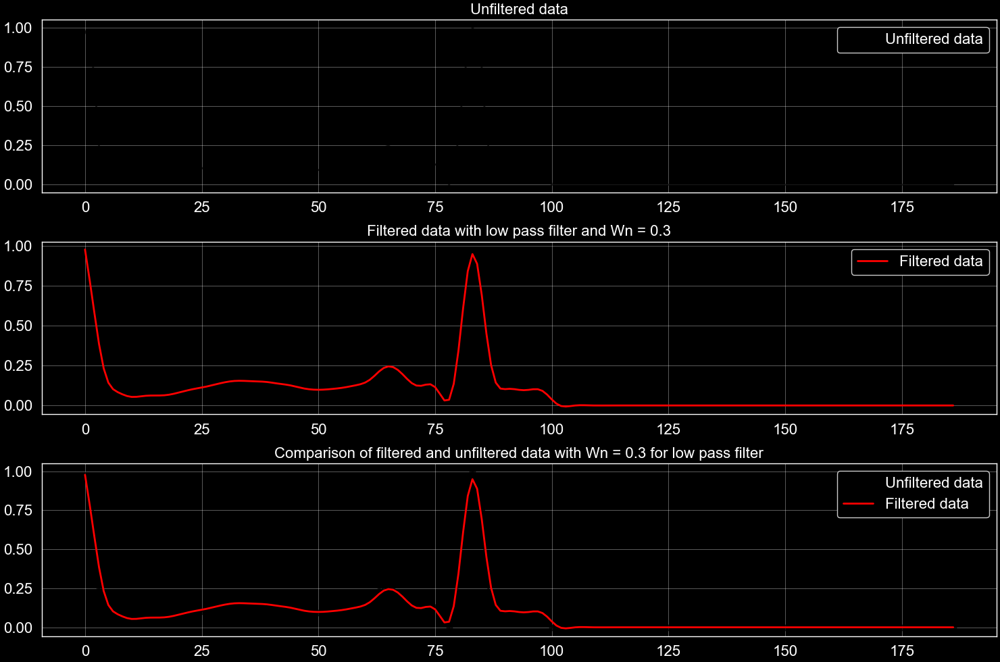

In [20]:
sample_data = N_condition[0,:]
compareSample(sample_data, 0.7, 3, 0.3);

- Though, the exact value of `Wn` is not known, we can perform a trial and error method to find the best value of `Wn` for our data. 
- This may be computationally expensive but it is a convenient way to find the best value of `Wn` for our data. 
- Obviously, we will not be doing this for all the data but we will do this for a subset of the data and see how the data looks like after the filtering.

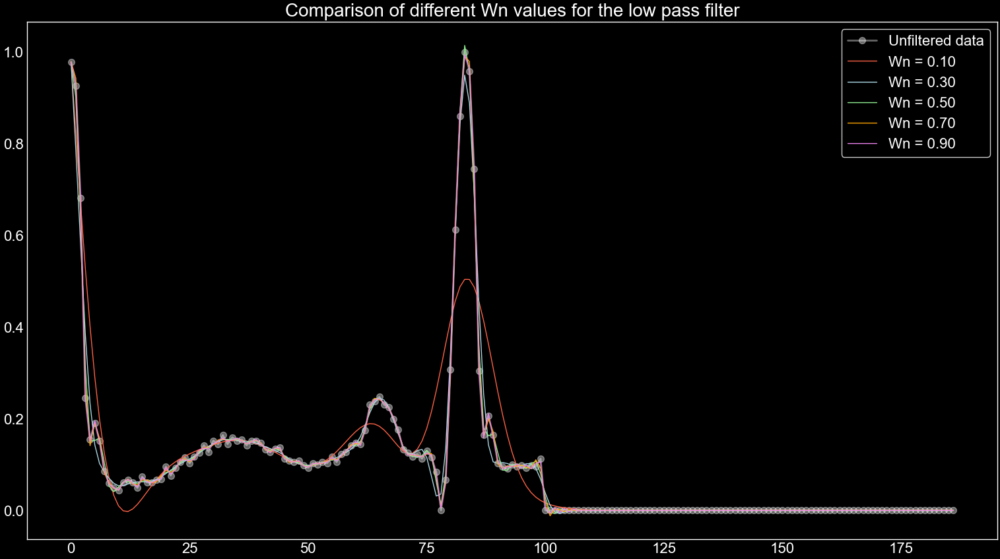

In [21]:
plt.style.use(["dark_background", '_mpl-gallery-nogrid'])

Wn_vals = [0.1, 0.3, 0.5, 0.7, 0.9]
sample_data = N_condition[0,:]
Order_of_filter = 3

colors = ["tomato", "lightblue", "lightgreen", "orange", "violet"]

plt.figure(figsize = (15, 8))

# Plot the original data
plt.plot(sample_data, 'o-', color = "white", label = "Unfiltered data", alpha = .4, markersize = 7)

for Wn_val, color in zip(Wn_vals, colors):

    # Filter the data
    b, a = scipy.signal.butter(Order_of_filter, Wn_val)
    filtered_data = scipy.signal.filtfilt(b, a, sample_data)

    # Plot the filtered data
    plt.plot(filtered_data,label = f"Wn = {Wn_val:.2f}", color = color, lw = 1)  

plt.legend()
plt.title("Comparison of different Wn values for the low pass filter", fontsize = 20)  
plt.show()

- Looks like except `Wn = 0.10` all other filters are performing quite well and the data looks quite clean.
- `Wn = 0.50 ` looks quite good and we will investigate this value in more detail on some more plots.

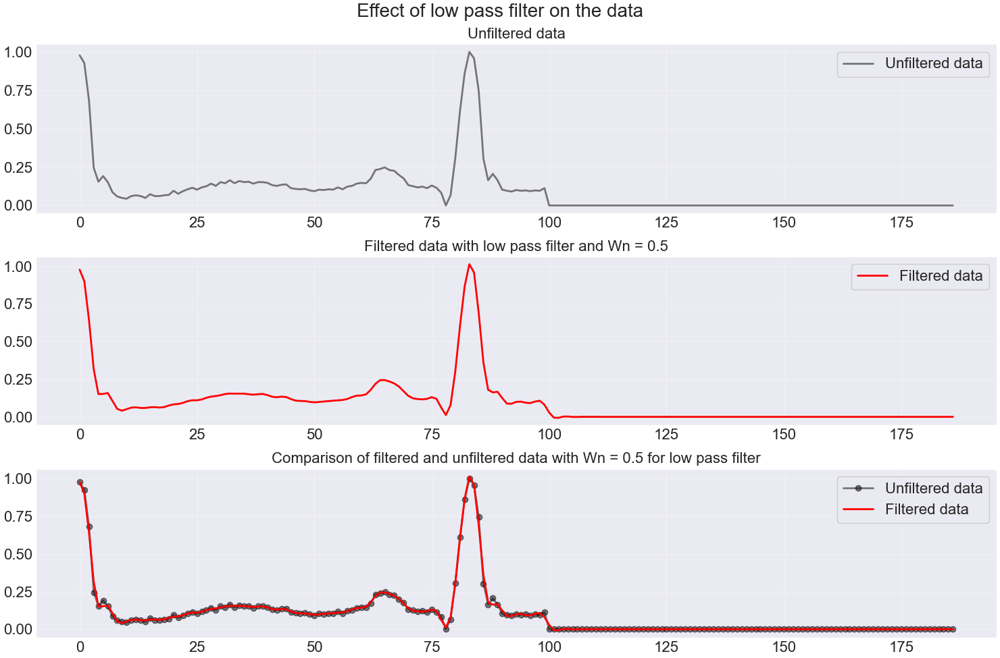

In [22]:
sns.set_style("darkgrid")
compareSample(sample_data, 0.5, 3, 0.5);
plt.suptitle("Effect of low pass filter on the data", fontsize = 20);
plt.tight_layout()

##### As expected `Wn = 0.5` looks quite promising and we will keep this value for our analysis, atleast for now.

### Improve Edges using Gustafsson's Method
---
- Padding can be done to reduce the edge effects of the filtering where edges are padded with duplicates if the edge data points and smooth the curve.
- However, this may not be a good idea as a stray point at th edges will greatly affect the shape of the smoothed data.
- Gustafsson's method is a better way to improve the edges of the data.
- Gustafsson's method is a method of smoothing data by fitting a polynomial to the data and then using the polynomial to estimate the values of the data at the edges. 

His method is described in the following article:  
[Link to Fredrick Gustaffon's 1994 paper](https://ieeexplore.ieee.org/document/492552)

Text(0.5, 1.0, 'Comparison of different methods to remove edge effects')

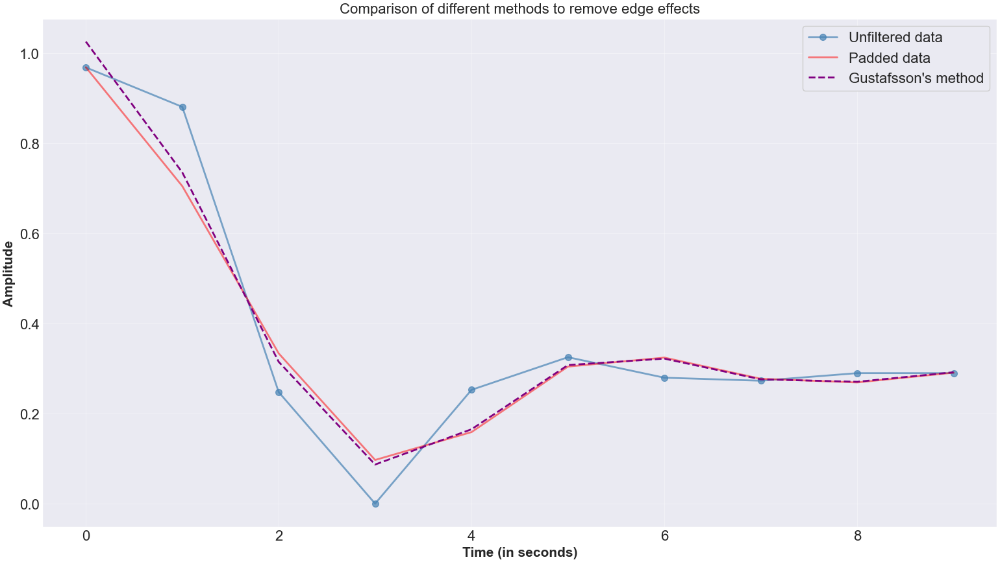

In [23]:
sns.set_style("darkgrid")
plt.figure(figsize = (15, 8))

# Take a sample of the data and then a chunk of it right at the beginning.
# We don't need to filter the end edge as is anywats 0 for almost all the data
sample_signal = N_condition[50000,:10]

# Filter data
b, a = scipy.signal.butter(3, 0.5)
filtered_data = scipy.signal.filtfilt(b, a, sample_signal, padlen=5)
filteredGust = scipy.signal.filtfilt(b, a, sample_signal, method = 'gust')

# Plot the data
plt.plot(sample_signal, 'o-', color = "steelblue", label = "Unfiltered data", alpha = 0.7, markersize = 7)
plt.plot(filtered_data, color = "red", label = "Padded data", alpha = .5)
plt.plot(filteredGust, '--', color = "purple", label = "Gustafsson's method")
plt.legend()
plt.xlabel("Time (in seconds)", fontsize = 15, fontweight = "bold")
plt.ylabel("Amplitude", fontsize = 15, fontweight = "bold")
plt.title("Comparison of different methods to remove edge effects")

- The 2 methods mostly look the same, but there are some minor differences at the extreme edges of the data.  
- This may be useful for the model.

## Seeing high-pass and band-pass filters
---

First we will design a code which would compare the 3 types of filters:
- Low pass
- High pass
- Band pass
on different plots with respect to the original signal.  

Then, we will see how they look in comparison with each other.

In [24]:
def comparefilters(data:np.ndarray) -> plt.figure:
    """Compare low pass, high pass and band pass filters
    Args:
        data (np.ndarray): The data to be filtered
    Returns:
        fig (plt.figure): The figure with the comparison"""
    
    fig, ax = plt.subplots(4, 1, figsize = (20, 15))
    ax1, ax2, ax3, ax4 = ax.ravel()

    # Filter the data for low pass
    b, a = scipy.signal.butter(3, 0.5, btype = "lowpass")
    filtered_data_lowpass = scipy.signal.filtfilt(b, a, data)

    # Filter the data for high pass
    b, a = scipy.signal.butter(3, .05, btype = "highpass")
    filtered_data_highpass = scipy.signal.filtfilt(b, a, data)

    # Filter the data for band pass
    b, a = scipy.signal.butter(3, [0.03, 0.4], btype = "bandpass")
    filtered_data_bandpass = scipy.signal.filtfilt(b, a, data)
    
    # Plot the data

    # Low pass plotting
    ax1.plot(filtered_data_lowpass, color = "red", label = "Low pass filtered data")
    ax1.plot(data, 'o-', color = "steelblue", label = "Unfiltered data", alpha = 0.7, markersize = 7)
    ax1.set_title("Low pass filtered data")

    # High pass plotting
    ax2.plot(filtered_data_highpass, color = "green", label = "High pass filtered data")
    ax2.plot(data, 'o-', color = "steelblue", label = "Unfiltered data", alpha = 0.7, markersize = 7)
    ax2.set_title("High pass filtered data")

    # Band pass plotting
    ax3.plot(filtered_data_bandpass, color = "purple", label = "Band pass filtered data")
    ax3.plot(data, 'o-', color = "steelblue", label = "Unfiltered data", alpha = 0.7, markersize = 7)
    ax3.set_title("Band pass filtered data")

    # Comparison of all three
    ax4.plot(filtered_data_lowpass, color = "red", label = "Low pass filtered data")
    ax4.plot(filtered_data_highpass, color = "green", label = "High pass filtered data")
    ax4.plot(filtered_data_bandpass, color = "purple", label = "Band pass filtered data")
    ax4.plot(data, 'o-', color = "steelblue", label = "Unfiltered data", alpha = 0.7, markersize = 7)
    ax4.set_title("Comparison of all three filters")

    plt.suptitle("Comparison of different filters", fontsize = 20, fontweight = "bold")
    for axi in ax.ravel():
        axi.legend()
    plt.tight_layout()
    return fig

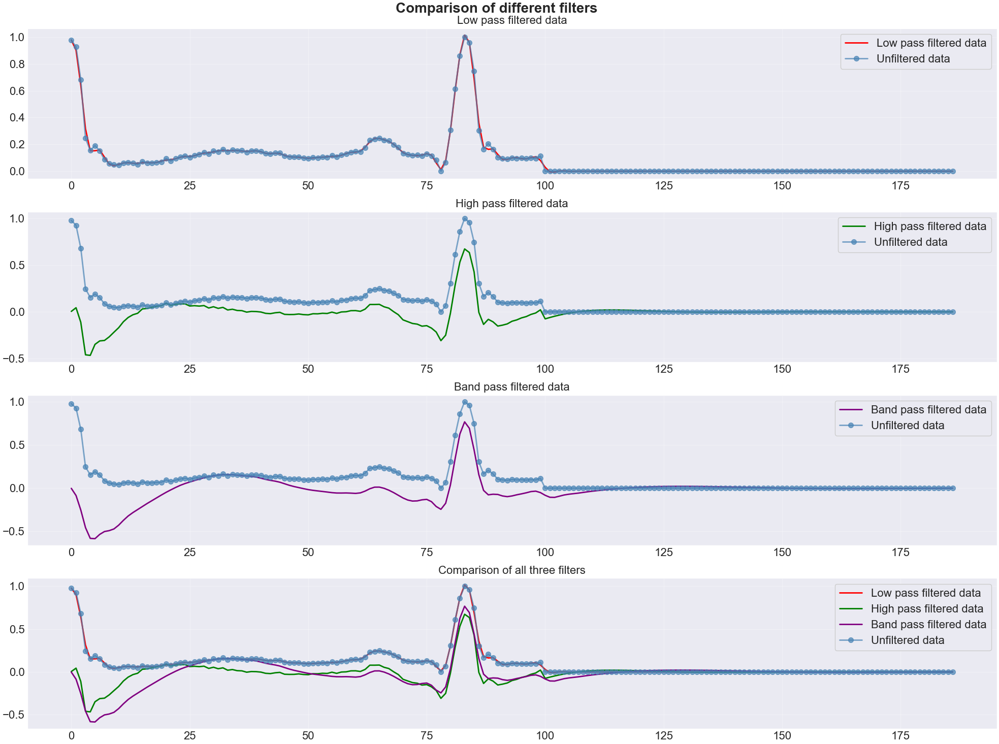

In [25]:
sample_data = N_condition[0,:]
comparefilters(sample_data);

- Different values for the `Wn` parameters were used for the filters
- But the `low pass` filter with `Wn = 0.5` looks the best.
- This is expected, because there is only low frequency noise in the data and the high frequency noise is not present in the data. So, a `low pass` filter would be the best choice for the data.

### Filtering using Convolution
---

- Here, we will create a window(typically a Gaussian window) and convolve it with the data to filter the data.
- This is a very simple way to filter the data and is very useful for filtering the data in real time.
- The window is a function of time and is typically a Gaussian function. 
- The wider the window, the more the data is smoothed and the narrower the window, the less the data is smoothed.
- The window is normalized to have a sum of 1 so as to preserve the total energy (amplitude) of the signal.

In [26]:
# Create a function to get the filtered data from a convolution with a given window size
def filtered_With_Convolution(data:np.array, windowSize:int) -> np.array:
    """Filter the data with a convolution with a given window size
    Args:
        data (np.array): The data to be filtered
        windowSize (int): The size of the window to be used for the convolution
    Returns:
        filtered_data (np.array): The filtered data
        window (np.array): The window used for the convolution"""
    
    # Create a hanning window
    window = np.hanning(windowSize)
    window /= window.sum() # Normalizing the window

    # Filter the data
    filtered_data = np.convolve(data, window, 'same')
    return filtered_data, window

Text(0.5, 1.0, 'Window')

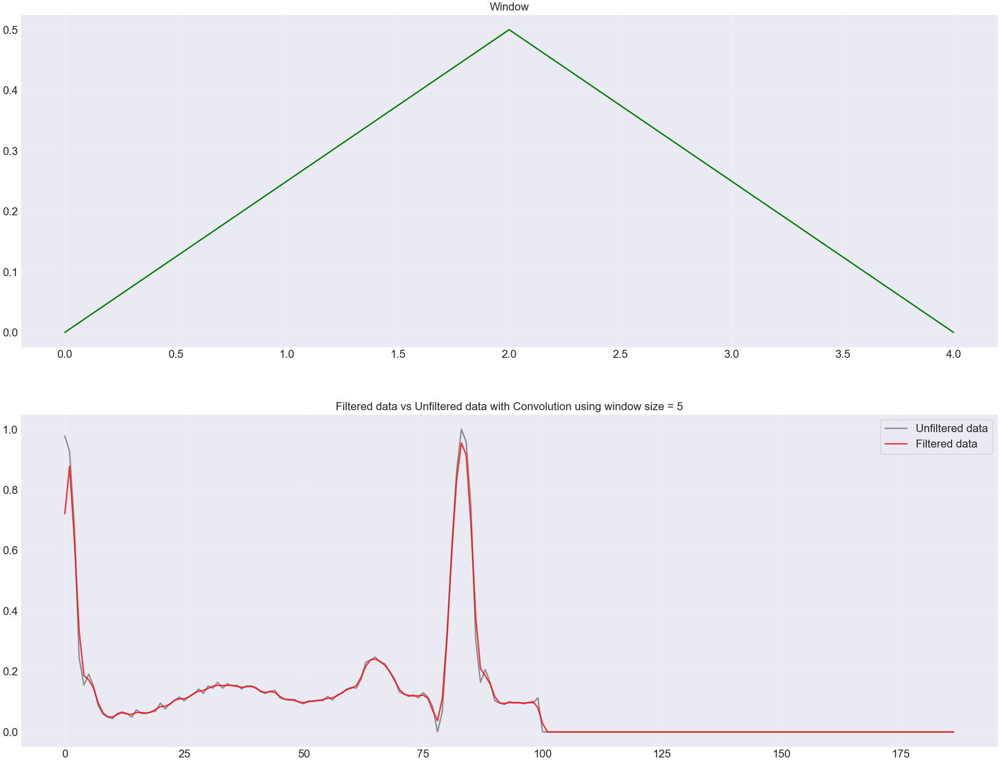

In [27]:
sns.set_style("darkgrid")
windowSize = 5

# Filter the data using convolution
sample_data = N_condition[0,:]
filtered_data, window = filtered_With_Convolution(sample_data, windowSize)

# Plot the data
fig, ax = plt.subplots(2, 1, figsize = (20, 15))
ax1, ax2 = ax.ravel()
ax2.plot(sample_data, '-', color = "black", label = "Unfiltered data", alpha = 0.4, markersize = 7)
ax2.plot(filtered_data, color = "red", label = "Filtered data", alpha = .8)
ax2.set_title("Filtered data vs Unfiltered data with Convolution using window size = {}".format(windowSize) )
ax2.legend()

# Plot the window
ax1.plot(window, color = "green", label = "Window")
ax1.set_title("Window")

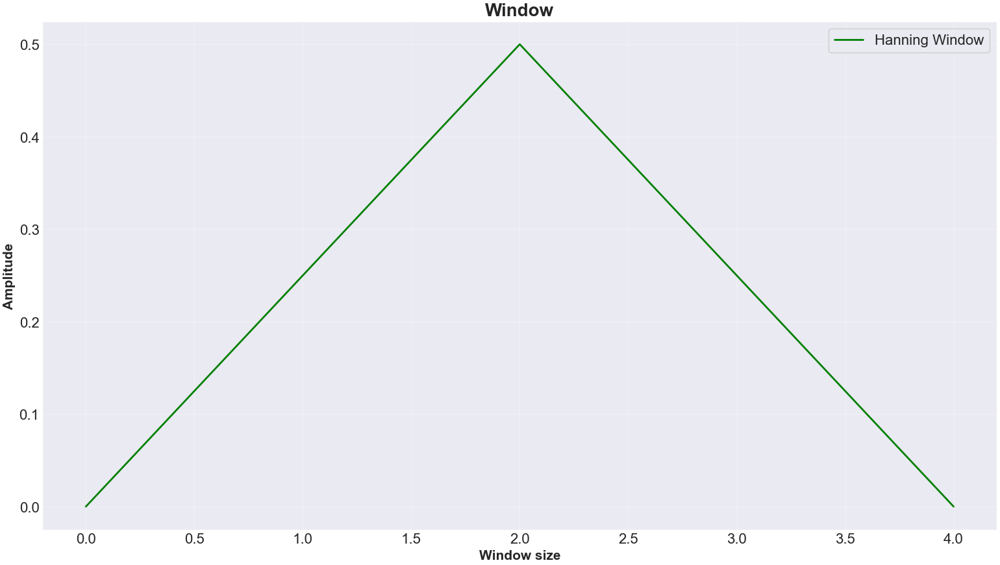

In [28]:
# Plot the window
plt.figure(figsize = (15, 8))
plt.plot(window, color = "green", label = "Hanning Window")
plt.title("Window", fontsize = 20, fontweight = "bold")

plt.xlabel("Window size", fontsize = 15, fontweight = "bold")
plt.ylabel("Amplitude", fontsize = 15, fontweight = "bold")
plt.legend()

- The convolving technique seems to be working quite well with the data.
- However, we see some edge effects in the data.
- We will try to improve the edges using Gustafsson's method.
- First let us see which `window size` works best for the data.

Text(0.5, 1.0, 'Comparison of different window sizes for Covolution Filtering')

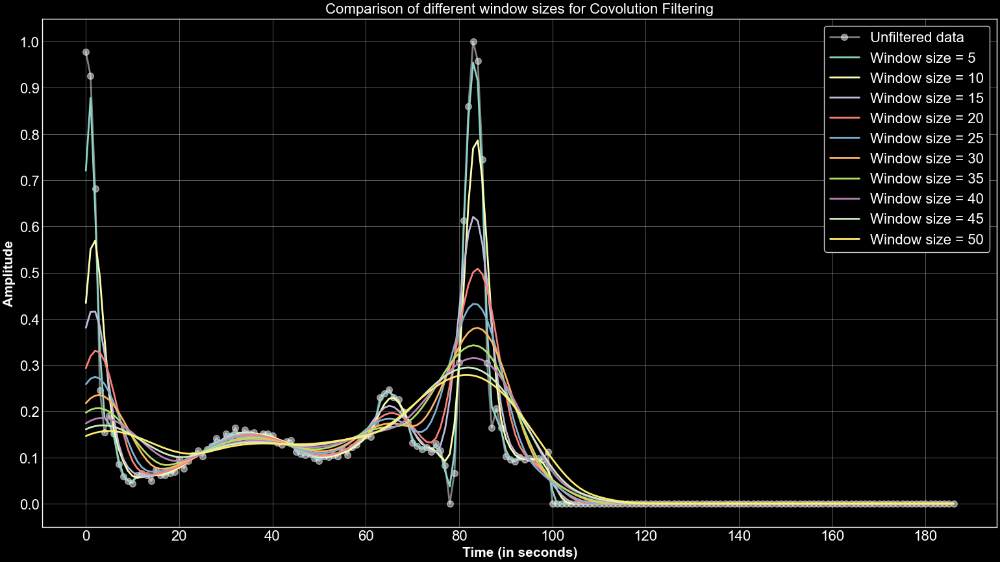

In [29]:
plt.style.use(["dark_background"])
plt.figure(figsize = (15, 8))

window_sizes = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

sample_data = N_condition[0,:] # Take a sample of the data
plt.plot(sample_data, 'o-', color = "white", label = "Unfiltered data", alpha = 0.5, markersize = 7)

for windowSize in window_sizes:
    # Filter the data using convolution
    filtered_data, _ = filtered_With_Convolution(sample_data, windowSize)

    # Plot the data
    plt.plot(filtered_data, label = f"Window size = {windowSize}")

plt.xlabel("Time (in seconds)", fontsize = 15, fontweight = "bold")
plt.ylabel("Amplitude", fontsize = 15, fontweight = "bold")

plt.locator_params(axis = "both", nbins = 20)

plt.legend()
plt.title("Comparison of different window sizes for Covolution Filtering")

- Looks like the smaller window sizes are the most effective in smoothing the data.
- We will use a window size of 5 for the data.

#### Let us now apply the Gustafsson's method to the data after filtering it with convolution.
- The LIMIT of Edge effects seems to be before the 10th index
- So, we will set the window to set the Gustafsson's method to 10.
- This means we will see the data only till the 10th index.

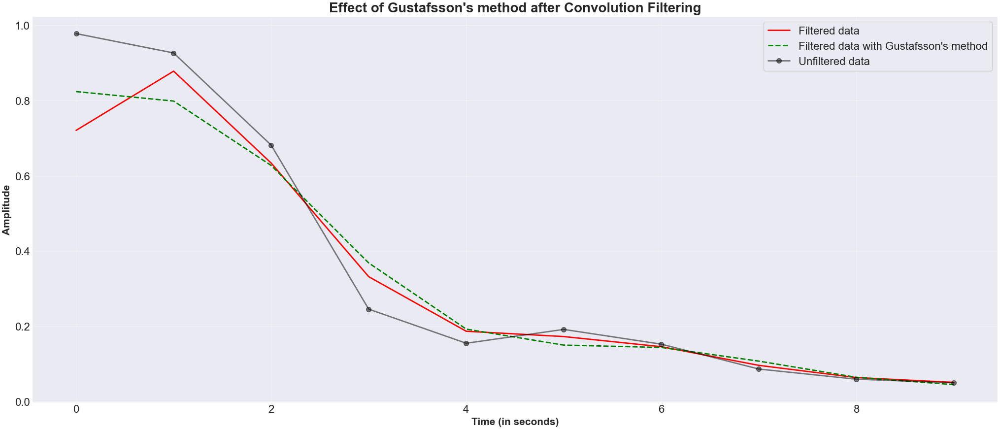

In [30]:
sns.set_style("darkgrid")
plt.figure(figsize = (20, 8))

LIMIT = 10
# Set a sample data
sample_data = N_condition[0, :]

# Filter the data using convolution
filtered_data, _ = filtered_With_Convolution(data=sample_data, windowSize=5)

# Perform Gustafsson's method
b, a = scipy.signal.butter(3, 0.5)
filtered_data_gustafsson = scipy.signal.filtfilt(b, a, filtered_data[:LIMIT], method="gust") 

plt.plot(filtered_data[:LIMIT], '-', color = "red", label = "Filtered data")
plt.plot(filtered_data_gustafsson, '--', color = "green", label = "Filtered data with Gustafsson's method")
plt.plot(sample_data[:LIMIT], 'o-', color = "black", label = "Unfiltered data", alpha = 0.5, markersize = 7)

plt.title("Effect of Gustafsson's method after Convolution Filtering", fontsize = 20, fontweight = "bold")
plt.xlabel("Time (in seconds)", fontsize = 15, fontweight = "bold")
plt.ylabel("Amplitude", fontsize = 15, fontweight = "bold")
plt.legend()

- So, the method works quite well
- The curve is smooth at the edges after applying the Gustafsson's method.
- Gustafsson's method also works quite well with `low pass` filters.

Now, we have a decision to make, 
- Do we use the `low pass` filter or the `convolution` filter?

#### Let us see how the data looks for these filters afer applying them on the data.

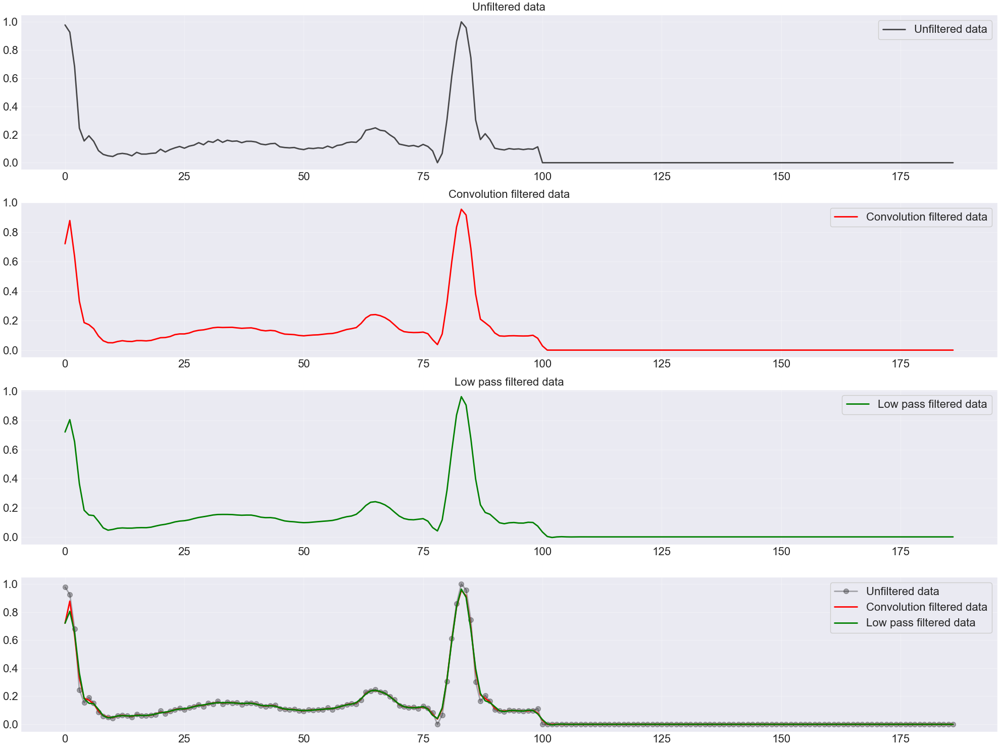

In [31]:
sample_data = N_condition[0,:]

# Filter the data using convolution
filtered_data_conv, _ = filtered_With_Convolution(data=sample_data, windowSize=5)

# Filter using low pass filter
b, a = scipy.signal.butter(3, 0.5)
filtered_data_lowpass = scipy.signal.filtfilt(b, a, filtered_data)

# Plot the data
sns.set_style("darkgrid")
fig, ax = plt.subplots(4, 1, figsize = (20, 15))
ax1, ax2, ax3, ax4 = ax.ravel()

# Unfiltered data
ax1.plot(sample_data, '-', color = "black", label = "Unfiltered data", alpha = 0.7, markersize = 7)
ax1.set_title("Unfiltered data")

# Convolution filtered data
ax2.plot(filtered_data_conv, color = "red", label = "Convolution filtered data")
ax2.set_title("Convolution filtered data")

# Low pass filtered data
ax3.plot(filtered_data_lowpass, color = "green", label = "Low pass filtered data")
ax3.set_title("Low pass filtered data")

# Comparison of all three
ax4.plot(sample_data, 'o-', color = "black", label = "Unfiltered data", alpha = 0.3, markersize = 7)
ax4.plot(filtered_data_conv, color = "red", label = "Convolution filtered data")
ax4.plot(filtered_data_lowpass, color = "green", label = "Low pass filtered data")

for axi in ax.ravel():
    axi.legend()
plt.tight_layout()

- Both the filters performed quite well on the data and very similar results were obtained.
- However, the `convolution` filter seems to be a bit better as it is able to capture the peaks of the data better.
- This might be useful when we are trying to extract features from the data.

### So, the decision is:
- We will use the `convolution` filter with a window size of 5 .
- In the `covolution filter`, we will use a `Hanming` window.
- Gustafsson's method with a window size of 10 from the begining of the filtered data by the convolution filter.
- In Gustafsson's method, we will use a `3rd order polynomial` to fit the data with a `Wn` value of `0.5`.

Let us now define general functions to do these tasks over the whole dataset.

In [32]:
def apply_convolution_filter(data:np.array, windowSize:float = 5) -> tuple[np.array, np.array]:
    """ Filter the data using convolution
    Args:
        data (np.array): The data to be filtered
        windowSize (float): The size of the window to be used for the convolution
    Returns:
        filtered_data (np.array): The filtered data
        window (np.array): The window used for the convolution"""
    
    # Create a hanning window
    window = np.hanning(windowSize)
    window /= window.sum() # Normalizing the window

    # Filter the data
    filtered_data = np.convolve(data, window, 'same')
    return (filtered_data, window)

def apply_gustaafson_filter(data:np.array,  limit:float = 10) -> np.array:
    """ Filter the data using Gustafsson's method
    
    Args:
        data (np.array): The data to be filtered
        limit (window): The limit of the data to be filtered by Gustafsson's method from the start
                        Only, the beginning of the data is filtered using Gustafsson's method to avoid
                        edge effects of the convolution.
    Returns:
        filtered_data_gust (np.array): The filtered data
    """
    
    data_to_see = data[:limit]
    # Filter using low pass filter
    b, a = scipy.signal.butter(3, 0.5)
    filtered_data_gust = scipy.signal.filtfilt(b, a, data_to_see, method="gust")
    return filtered_data_gust

We will test the functions on a sample data to see if we get the expected outputs.

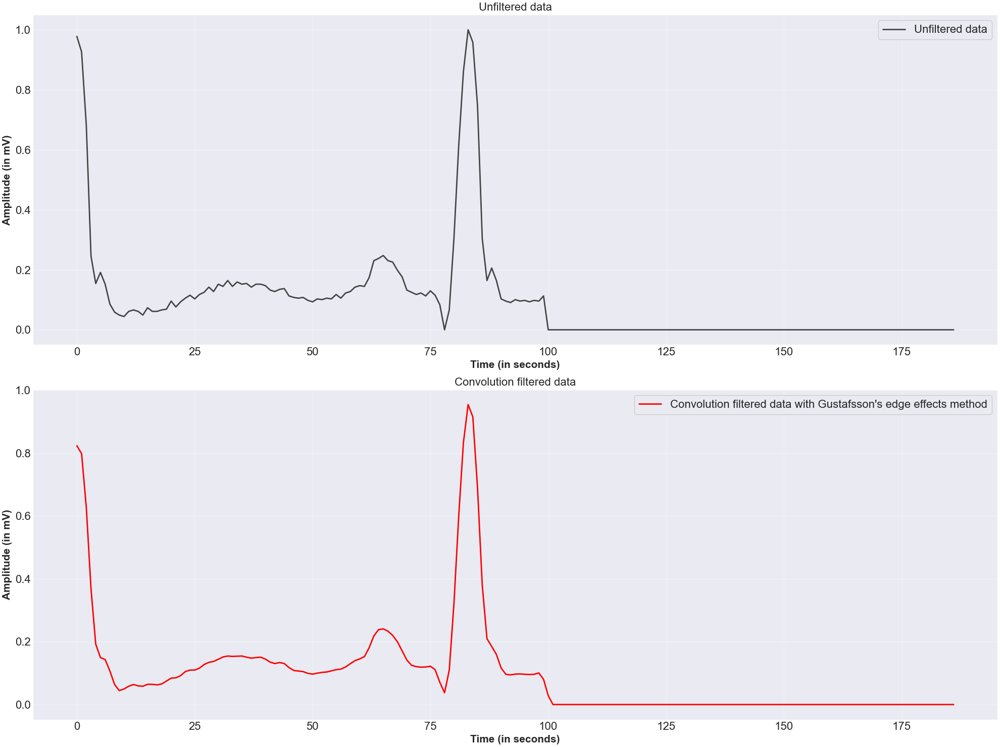

In [35]:
test_signal = N_condition[0,:]
LIMIT = 10
WINDOW_SIZE = 5

# Filter the data using convolution
filtered_data_conv, _ = apply_convolution_filter(data=test_signal, windowSize=WINDOW_SIZE)

# Filter using Gustafsson's method
filtered_data_gust = apply_gustaafson_filter(data=filtered_data_conv, limit=LIMIT)

# Set the first 10 values of the filtered data to the Gustafsson filtered data
filtered_data_conv[:10] = filtered_data_gust

# Plot the data
sns.set_style("darkgrid")
fig, ax = plt.subplots(2, 1, figsize = (20, 15))
ax1, ax2 = ax.ravel()
ax1.plot(test_signal, '-', color = "black", label = "Unfiltered data", alpha = 0.7, markersize = 7)
ax1.set_title("Unfiltered data")

ax2.plot(filtered_data_conv, color = "red", 
        label = "Convolution filtered data with Gustafsson's edge effects method")
ax2.set_title("Convolution filtered data")

for axi in ax.ravel():
    axi.legend()
    axi.set_xlabel("Time (in seconds)", fontsize = 15, fontweight = "bold")
    axi.set_ylabel("Amplitude (in mV)", fontsize = 15, fontweight = "bold")




plt.ylabel("Amplitude (in mV)", fontsize = 15, fontweight = "bold")
plt.tight_layout()

- So, we need to apply our 2 functions `row-wise` to our dataframe. 
- However, there are `87,554` rows in our data which may make it computationally expensive to apply the functions row-wise using a `for loop`
- So, we will use the `Pandas.apply` function to apply the functions row-wise to our dataframe.
- As our functions have more than 1 parameter, we will wrap the functions in an anonymous `lambda` function.

In [ ]:
target_data = mit_data.drop(columns = [187, "Condition"])
target_data_test = mit_data_test.drop(columns = [187, "Condition"])

WINDOW_SIZE :int = 5
LIMIT :int = 10

# Filter the data using convolution
filter_lambda_func = lambda row: apply_convolution_filter(data=row.values, windowSize=WINDOW_SIZE)[0]
# We take the 0th index as 'apply_convolution_filter' returns (filtered_data, window)
filtered_data_final = target_data.apply(filter_lambda_func, axis = 1) # Traing data
filtered_data_final_test = target_data_test.apply(filter_lambda_func, axis = 1) # Test data

# Convert to a dataframe
filtered_data_final = pd.DataFrame(np.vstack(filtered_data_final)) # Training data
filtered_data_final_test = pd.DataFrame(np.vstack(filtered_data_final_test)) # Test data

# Apply Gustafsson's method to the filtered data
gauffson_lambda_func = lambda row: apply_gustaafson_filter(data=row.values, limit=LIMIT)
gauff_filtered_data = filtered_data_final.apply(func=gauffson_lambda_func, axis=1) # Training data
gauff_filtered_data_test = filtered_data_final_test.apply(func=gauffson_lambda_func, axis=1) # Test data

# Convert to a dataframe
gauff_filtered_data = pd.DataFrame(np.vstack(gauff_filtered_data)) # Training data
gauff_filtered_data_test = pd.DataFrame(np.vstack(gauff_filtered_data_test)) # Test data

# Set the first "LIMIT" values for the Convolution Filtered data to Gauff filtered Data
# NOTE: The shape of the returned array by the Gauff filter will be (total_no_of_rows, "LIMIT")
filtered_data_final.iloc[:, :LIMIT] = gauff_filtered_data
filtered_data_final_test.iloc[:, :LIMIT] = gauff_filtered_data_test

# Set the label columns
filtered_data_final[187] = mit_data[187] # Training data
filtered_data_final_test[187] = mit_data_test[187] # Test data

filtered_data_final["Condition"] = mit_data["Condition"] # Training data
filtered_data_final_test["Condition"] = mit_data_test["Condition"] # Test data

#### Let's test our code

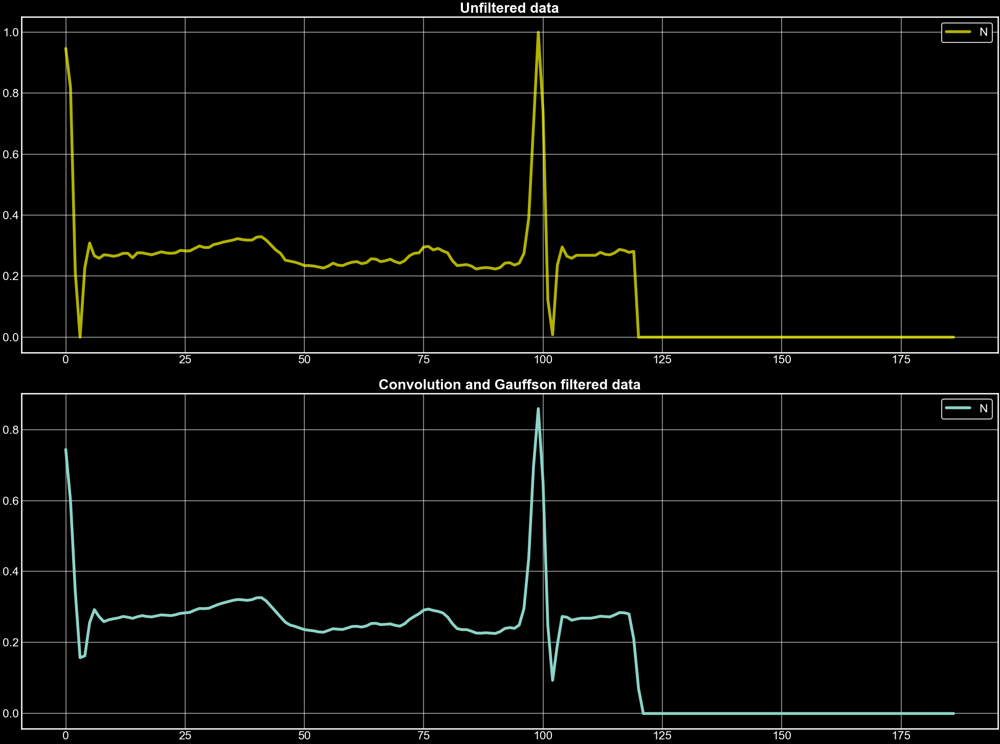

In [ ]:
plt.style.use(["dark_background"])
fig, ax = plt.subplots(2, 1, figsize = (20, 15))
ax1, ax2 = ax.ravel()

WHICH_ECG_TO_PLOT = 19000

# Unfiltered data
ax1.plot(mit_data.iloc[WHICH_ECG_TO_PLOT, :187], '-', color = "yellow", lw = 4,
        label = mit_data.loc[WHICH_ECG_TO_PLOT]["Condition"],
        alpha = 0.7, markersize = 7)
ax1.set_title("Unfiltered data", fontsize = 20, fontweight = "bold")

# Convolution filtered data
ax2.plot(filtered_data_final.iloc[WHICH_ECG_TO_PLOT,:187], lw=4,
        label = filtered_data_final.loc[WHICH_ECG_TO_PLOT]["Condition"])
ax2.set_title("Convolution and Gauffson filtered data", fontsize = 20, fontweight = "bold")

for axi in ax.ravel():
    axi.legend()
plt.tight_layout()

So, now:
- We checked some filters and selected a well performing filter from them. -`Convolution filter`
- We found out the best parameters for the filter. -`Window size = 5`
- We handled the edge effects of the filter -`Gustafsson's method`
- We found out the limit for applying the edge effect filter `LIMIT = 10`
- We applied the filter and edge effect filter to the whole dataset.
- We saved the filtered data to a new dataframe.

Now, let us save our data as filtered data in the form of `csv` files

In [ ]:
# Save the filtered data
filtered_data_final.to_csv("filtered_data.csv", index = False) # Training data
filtered_data_final_test.to_csv("filtered_data_test.csv", index = False) # Test data

## Feature Extraction for Machine Learning
---

There are a variety of features I can think of using for this data.  
I will group them into 2 categories:
- Purely Mathematical features
    - Functions which don't need the sampling frequency
    - Functions which need sampling frequency
- Biological based features

### Purely Mathematical Features
---
These features are based on the mathematical properties of the data.
- Mean
- Median
- Standard Deviation
- Kurtosis
- Skewness
- Shannon Entropy
- log entropy energy
- Fudamental frequency
- Maximum power spectrum
- Median Absolute Deviation
- Absolute Energy
- Area under the curve (AUC)
- Power bandwidth (the frequency range where the power is 95% of the total power)

We will be using a module called `tsfel` to extract these features.

In [ ]:
import tsfel

- First we make a list of all the functions which need just the signal and NOT the sampling frequency and another list where the functions need the sampling frequency.
- Then, we will iterate over these lists and extract the features from the data.

In [7]:
filtered_data_final = pd.read_csv("filtered_data.csv")

In [8]:
feature_df = pd.DataFrame() # Store the features in this dataframe
feature_df["Condition"] = filtered_data_final["Condition"]
target_filtered_data = filtered_data_final.drop(columns = ["Condition", '187'], axis = 1)

In [9]:
# Mathematical Functions which don't ned sampling frequency
functions_no_sf = [tsfel.abs_energy, tsfel.autocorr, tsfel.calc_mean, tsfel.calc_median,
                   tsfel.calc_std, tsfel.entropy, tsfel.kurtosis, tsfel.mean_abs_deviation,
                   tsfel.negative_turning, tsfel.positive_turning, tsfel.skewness, tsfel.zero_cross]

for func in functions_no_sf:
    feature_df[func.__name__] = target_filtered_data.apply(func, axis = 1)

Let us see a quick look at the first 5 rows of our feature dataframe and see its shape to see if everything is as expected

In [10]:
print(f"Shape of Feature Dataframe = {feature_df.shape}")
feature_df.head(5)

Shape of Feature Dataframe = (87554, 13)


,Condition,abs_energy,autocorr,calc_mean,calc_median,calc_std,entropy,kurtosis,mean_abs_deviation,negative_turning,positive_turning,skewness,zero_cross
0,N,6.867802,6.867802,0.097330,0.062500,0.165085,0.597941,12.045043,0.096499,11,11,3.302022,1
1,N,5.553204,5.553204,0.088866,0.052707,0.147646,0.784679,13.375905,0.082924,18,19,3.482506,1
2,N,3.448836,3.448836,0.060759,0.016216,0.121455,0.573285,13.333301,0.072357,9,9,3.421986,1
3,N,5.554490,5.554490,0.082954,0.011050,0.151069,0.584582,11.384935,0.093485,8,8,3.182791,1
4,N,8.390943,8.390943,0.115499,0.052817,0.177571,0.808623,9.056488,0.109458,24,25,2.941366,1


### Analysis of mathematical features which don't need sampling frequency
- Let us see the distribution of all the parameters as a whole.  
- Then, we shall see the distribution of the parameters for each kind of disease

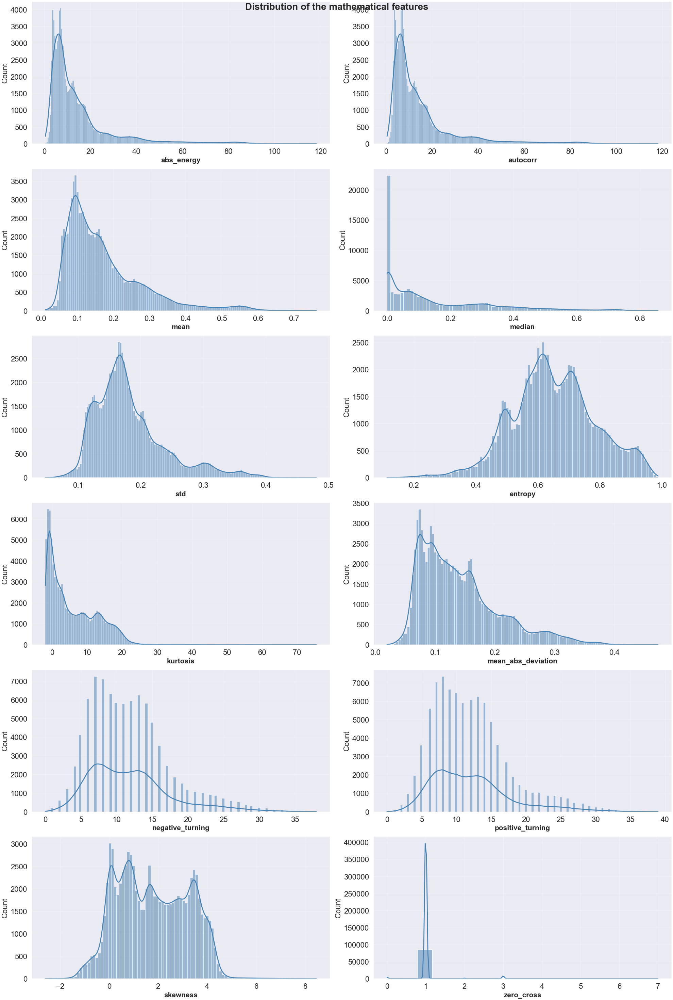

In [11]:
sns.set_style('darkgrid')

fig, ax = plt.subplots(6, 2, figsize = (20, 30))

for idx, col in enumerate(feature_df.columns[1:]): # The first column is the condition
    axi = ax.ravel()[idx]
    sns.histplot(feature_df[col], ax = axi, color = "steelblue", kde = True)
    axi.set_xlabel(col.replace("calc_", ""), fontsize = 15, fontweight = "bold")

plt.suptitle("Distribution of the mathematical features", fontsize = 20, fontweight = "bold")
plt.tight_layout()

- Most of the features are almost continuous
- `negative turning points` and `positive turning points` are discrete features. It makes sense as the number of turning points in a signal is discrete. It may be interesting to see how the number of turning points vary with the disease.
- `Zero cross` is almost fully unity. It may make sense to drop this feature as it does not vary much with the disease. We will see this later.
- `kurtosis` is almost in the range og 0-10 for the entire dataset. 
- `entropy` varies for the entire dataset. It will be interesting to see how it varies with the disease.
- `absolute energy` ans `autocorrelation` are both almost completely in the range of 0-20. It won't make sense to investigate these 2 features for individual diseases as will probably get overlapping results.
- `Median` has a sharp peak in the range 0-0.1. It will be interesting to see how it varies with the disease and what disease especially contributes to this peak. It's probably due to the large number of data points for the `N` disease.
- `skewness` of the dataset also varies quite a bit. It may make sense to see how it varies with the disease.
 

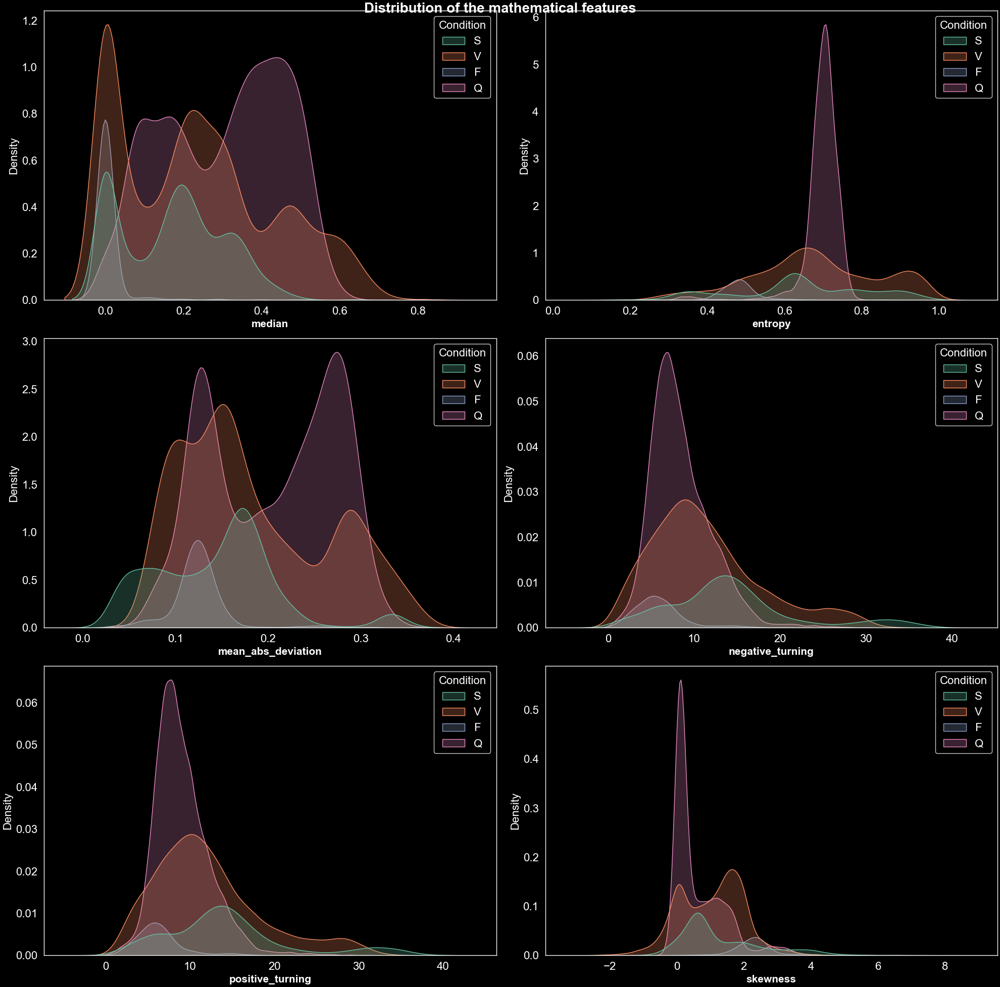

In [12]:
features_to_see = ["calc_median", "entropy",  "mean_abs_deviation", 
                "negative_turning","positive_turning", "skewness"]
plt.style.use(["dark_background"])
fig, ax = plt.subplots(3, 2, figsize = (20, 20))

for idx, col in enumerate(features_to_see):
    axi = ax.ravel()[idx]
    axi.grid(False) # Remove the grid
    sns.kdeplot(data = feature_df.query("Condition != 'N'"), x = col, hue = "Condition",  
                ax = axi, fill = True, palette="Set2")
    axi.set_xlabel(col.replace("calc_", ""), fontsize = 15, fontweight = "bold")

plt.suptitle("Distribution of the mathematical features", fontsize = 20, fontweight = "bold")
plt.tight_layout()

- We didnot plot the `N` disease as it would have overpowered the other plots due to its vast number of datapoints.
- We can see that there are differences in peaks for the `negative turning points` and `positive turning points` for the diseases.
- There are differences in peaks for the `mean_absolute_deviation` and the `median` for the diseases.
- These may turn out to be good features for the classification of the diseases.

Let's see how the features are interrelated with each other using correlation matrix and heat maps

In [13]:
feature_df.corr(numeric_only=True)

,abs_energy,autocorr,calc_mean,calc_median,calc_std,entropy,kurtosis,mean_abs_deviation,negative_turning,positive_turning,skewness,zero_cross
abs_energy,1.000000,1.000000,0.953489,0.838814,0.802667,0.311552,-0.563772,0.750189,0.048862,0.087539,-0.729097,-0.021174
autocorr,1.000000,1.000000,0.953489,0.838814,0.802667,0.311552,-0.563772,0.750189,0.048862,0.087539,-0.729097,-0.021174
calc_mean,0.953489,0.953489,1.000000,0.899017,0.719182,0.461800,-0.654862,0.691412,0.198242,0.234224,-0.835428,-0.053109
calc_median,0.838814,0.838814,0.899017,1.000000,0.556320,0.585028,-0.491773,0.535341,0.283420,0.315013,-0.704325,-0.024291
calc_std,0.802667,0.802667,0.719182,0.556320,1.000000,-0.051548,-0.716907,0.974608,-0.295108,-0.257932,-0.706359,0.055877
entropy,0.311552,0.311552,0.461800,0.585028,-0.051548,1.000000,-0.072227,-0.103989,0.674103,0.689942,-0.232202,-0.062960
kurtosis,-0.563772,-0.563772,-0.654862,-0.491773,-0.716907,-0.072227,1.000000,-0.782121,0.137023,0.115954,0.934567,-0.003878
mean_abs_deviation,0.750189,0.750189,0.691412,0.535341,0.974608,-0.103989,-0.782121,1.000000,-0.318573,-0.286410,-0.763895,0.056664
negative_turning,0.048862,0.048862,0.198242,0.283420,-0.295108,0.674103,0.137023,-0.318573,1.000000,0.979040,-0.019549,-0.104184
positive_turning,0.087539,0.087539,0.234224,0.315013,-0.257932,0.689942,0.115954,-0.286410,0.979040,1.000000,-0.044118,-0.106430


<Axes: >

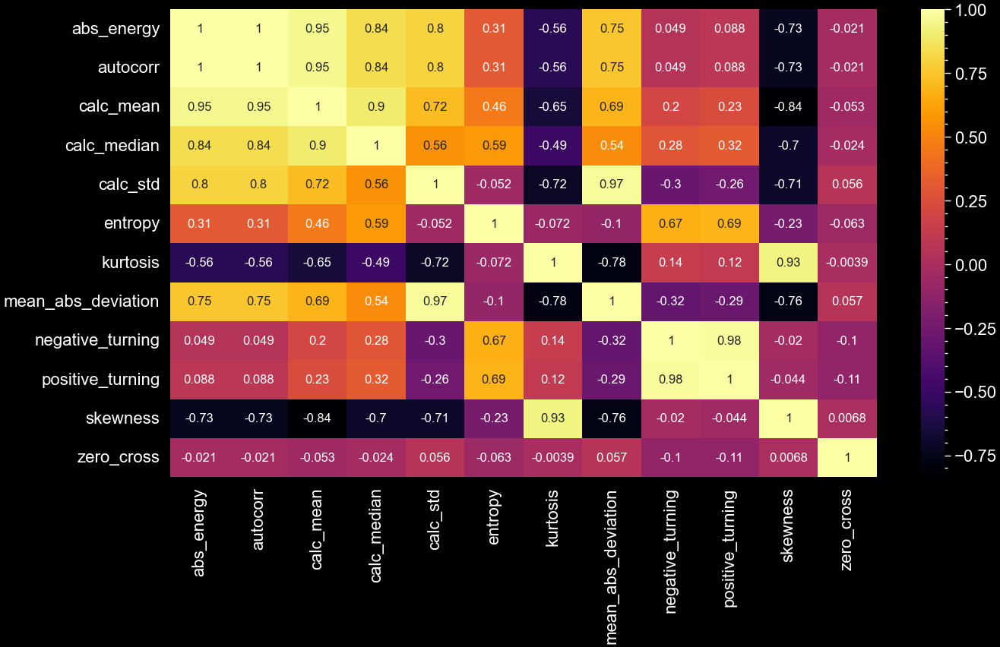

In [14]:
plt.figure(figsize = (15, 8))
sns.heatmap(feature_df.corr(numeric_only=True), annot = True, cmap = "inferno", annot_kws={'size': 12})

- There are some features which are highly correlated with each other. 
- It may be meaningful to drop some of these features from each such high correlated pair to reduce the dimensionality of the data.

Let's see what percentages of the columns are correlated to each other highly.  
Let us hold a threshold of 0.8 for a high correlation.

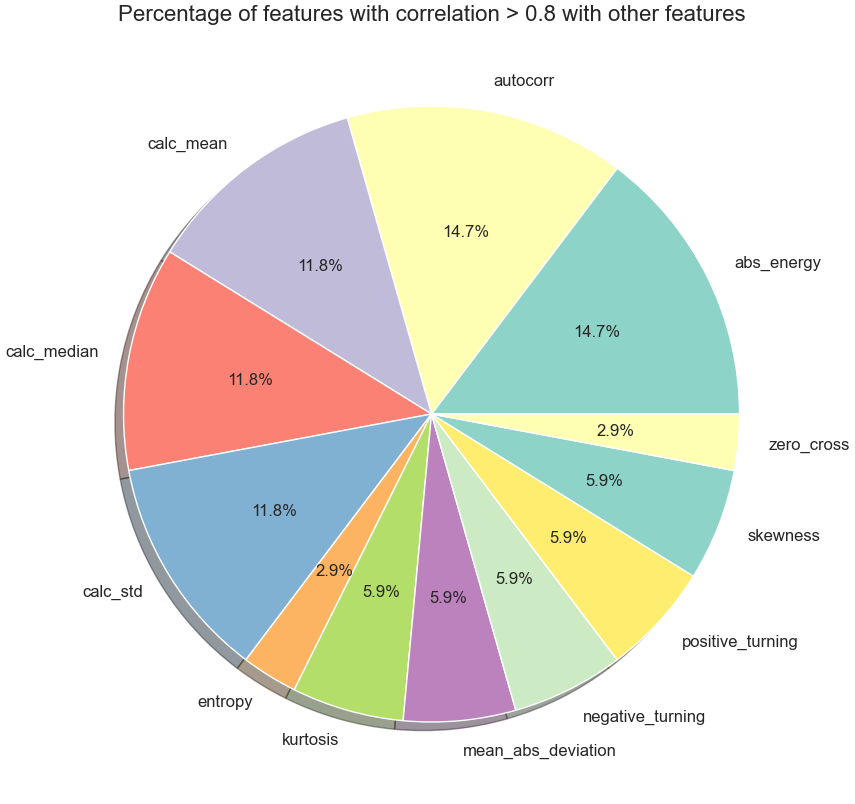

In [15]:
sns.set_style('darkgrid')
((feature_df.corr(numeric_only=True) > 0.8).sum()/len(feature_df.columns[1:]))\
                                            .plot(kind = 'pie', shadow = True, autopct = '%1.1f%%',
                                             figsize = (10, 10), fontsize = 12, 
                                    title = "Percentage of features with correlation > 0.8 with other features");

Let us see how the features compare to each other for each disease in a pair plot.  
However, as the data is huge, we will only use a `sample` of the data for this.

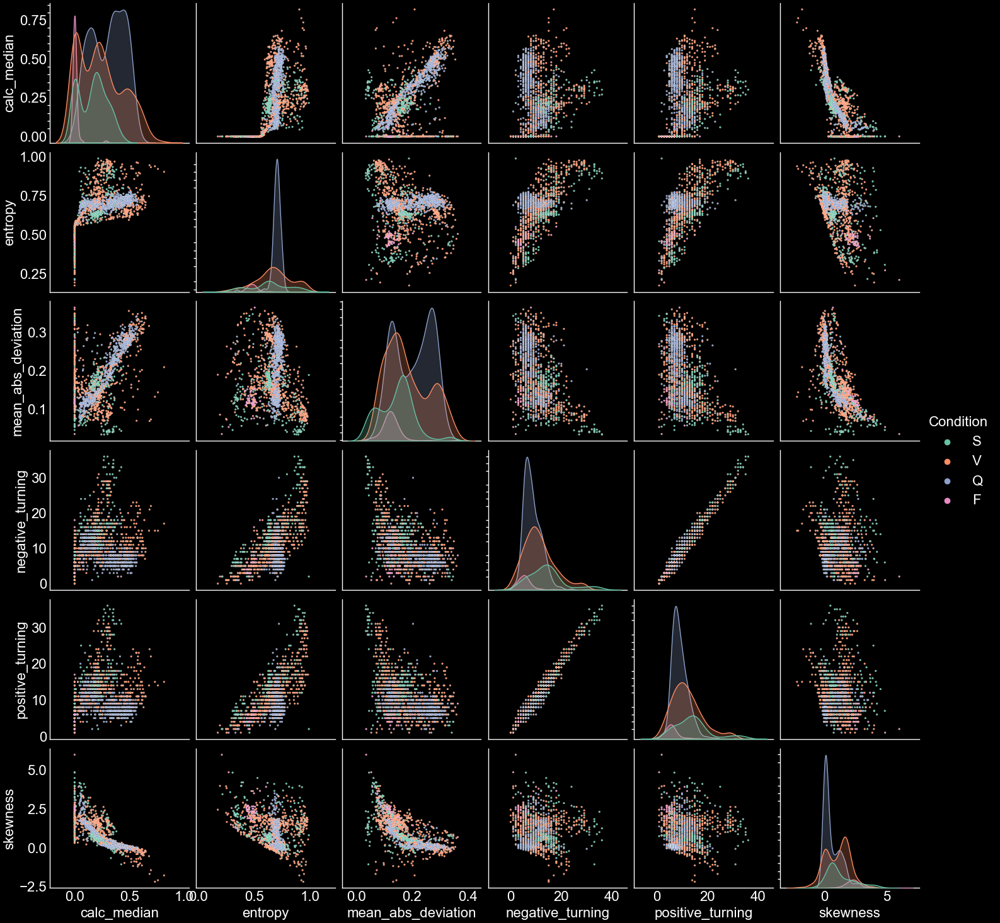

In [16]:
features_to_see = ["calc_median", "entropy",  "mean_abs_deviation", 
                "negative_turning","positive_turning", "skewness"]

frac_of_data = 0.1 # Fraction of data to be plotted
plt.style.use(["dark_background",  '_mpl-gallery-nogrid'])
sns.pairplot(feature_df.query("Condition != 'N'").sample(frac=frac_of_data), vars = features_to_see, 
                                hue = "Condition", kind = "scatter",
                                palette = "Set2", diag_kind = "kde", plot_kws={"s": 4});


In [17]:
# Mathematical Functions which need sampling frequency
SAMPLING_FREQ = 125 # Hz

function_sf = [tsfel.auc, tsfel.calc_centroid, tsfel.fundamental_frequency, tsfel.human_range_energy, 
               tsfel.max_frequency, tsfel.max_power_spectrum, tsfel.median_frequency, tsfel.power_bandwidth, 
               tsfel.spectral_centroid, tsfel.spectral_decrease, tsfel.spectral_distance, tsfel.spectral_entropy,
                tsfel.spectral_skewness, tsfel.spectral_kurtosis, tsfel.spectral_variation, tsfel.total_energy]

for idx, func in enumerate(function_sf):
    feature_df[func.__name__] = target_filtered_data.apply(func, args = (SAMPLING_FREQ,), axis = 1)
    print(f"Done with {func.__name__}. {len(function_sf) - (idx + 1)} functions left")

Done with auc. 15 functions left
Done with calc_centroid. 14 functions left
Done with fundamental_frequency. 13 functions left
Done with human_range_energy. 12 functions left
Done with max_frequency. 11 functions left
Done with max_power_spectrum. 10 functions left
Done with median_frequency. 9 functions left
Done with power_bandwidth. 8 functions left
Done with spectral_centroid. 7 functions left
Done with spectral_decrease. 6 functions left
Done with spectral_distance. 5 functions left
Done with spectral_entropy. 4 functions left
Done with spectral_skewness. 3 functions left
Done with spectral_kurtosis. 2 functions left
Done with spectral_variation. 1 functions left
Done with total_energy. 0 functions left


Let us have a look at the feature dataframe and its shape again and see if everything matches

In [18]:
print(f"Shape of Feture Dataframe = {feature_df.shape}")
feature_df.head(5)

Shape of Feture Dataframe = (87554, 29)


,Condition,abs_energy,autocorr,calc_mean,calc_median,calc_std,entropy,kurtosis,mean_abs_deviation,negative_turning,positive_turning,skewness,zero_cross,auc,calc_centroid,fundamental_frequency,human_range_energy,max_frequency,max_power_spectrum,median_frequency,power_bandwidth,spectral_centroid,spectral_decrease,spectral_distance,spectral_entropy,spectral_skewness,spectral_kurtosis,spectral_variation,total_energy
0,N,6.867802,6.867802,0.097330,0.062500,0.165085,0.597941,12.045043,0.096499,11,11,3.302022,1,0.142310,0.436070,0.673913,0.186979,49.869565,0.308147,8.086957,14.037433,13.752005,-0.526023,-3970.975110,0.681886,1.439213,4.309573,0.173968,4.615459
1,N,5.553204,5.553204,0.088866,0.052707,0.147646,0.784679,13.375905,0.082924,18,19,3.482506,1,0.129841,0.548730,1.347826,0.109467,50.543478,0.174539,8.760870,14.037433,14.338095,-0.556542,-3554.515024,0.703965,1.396882,4.159423,0.311124,3.731992
2,N,3.448836,3.448836,0.060759,0.016216,0.121455,0.573285,13.333301,0.072357,9,9,3.421986,1,0.088106,0.348774,0.673913,0.175591,51.217391,0.119292,10.782609,21.390374,15.988460,-0.395522,-2712.431818,0.730193,1.162741,3.526940,0.194518,2.317766
3,N,5.554490,5.554490,0.082954,0.011050,0.151069,0.584582,11.384935,0.093485,8,8,3.182791,1,0.121368,0.445779,0.673913,0.209569,49.195652,0.318518,8.086957,13.368984,13.229104,-0.495552,-3604.043871,0.661895,1.523585,4.558869,0.156953,3.732856
4,N,8.390943,8.390943,0.115499,0.052817,0.177571,0.808623,9.056488,0.109458,24,25,2.941366,1,0.169441,0.525570,1.347826,0.181981,49.869565,0.312083,7.413043,11.363636,13.154228,-0.694076,-4187.827142,0.613336,1.560407,4.661348,0.475716,5.639074


### Analysis of features which require Sampling Frequency
- Now, let us see the mathematical features which `need the Sampling frequency` as a whole.  
- Then, we will see how these features vary `with respect to each disease`.  
- After that, we will see their correlation matrix and visualize them using a `heatmap`. 
- Post of this, we will use `pairplotting` to find any general trends of the features with respect to each other.
- From these, we will figure out if we can `remove any redundant features` which may be highly correlated to each other.

In [19]:
feature_math_sf = ['auc','calc_centroid', 'fundamental_frequency', 'human_range_energy',
                    'max_frequency', 'max_power_spectrum', 'median_frequency',
                    'power_bandwidth', 'spectral_centroid', 'spectral_decrease',
                    'spectral_distance', 'spectral_entropy', 'spectral_skewness',
                    'spectralst_kurtosis', 'spectral_variation', 'total_energy']
print(f"Number of Mathematical features which require sampling freq = {len(feature_math_sf)}")

Number of Mathematical features which require sampling freq = 16


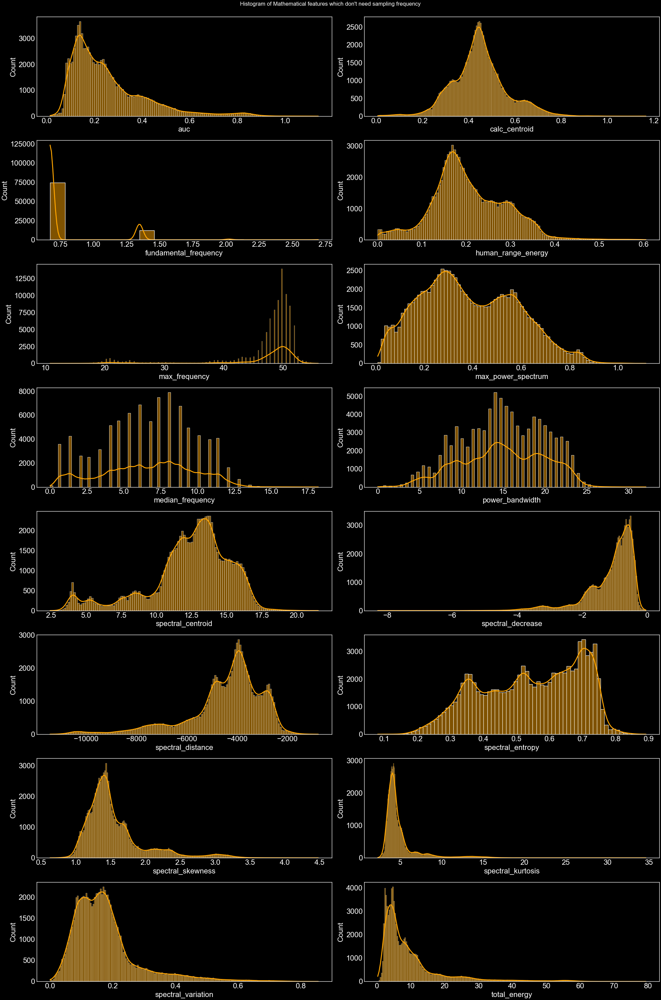

In [20]:
fig, ax = plt.subplots(8, 2, figsize = (20, 30))

for idx, feature in enumerate(feature_math_sf):
    sns.histplot(data = feature_df, x = feature, ax = ax.ravel()[idx], color = "orange", kde = True)
plt.suptitle("Histogram of Mathematical features which don't need sampling frequency", y = 1)
plt.tight_layout()

- `Centroid` has a sharp and fat peak which is expected because of the nature of the signal.
- `Spectral Variation` seems to be quite spread. It may be interesting to see how it varies with diseases.
- `Spectral entropy` seems to be quite spread as well. It would be interesting to see its variation as well.
- Same can be said with `Spectral Centroid` and `max_power_spectrum`. 
- The `median frequency` distribution is discrete which makes sense as the median frequency is a discrete number.
- `power bandwidth` is also quite spread out and may be interesting to look at for individual diseases as well.
- `human_range_entropy` has a sharp peak but has a nice and fat plateau as well. It may be because of the huge number of data points for `N` disease.
- `Max frequency` is almost completely clustered. So, it won't be necessary to look at it individually.
- Same is with `Fundamental frequency` which makes sense as all the ECGs have the sampe Sampling Frequency(125 Hz)
- The `Area under the curve(auc)` has a spread out distribution as well. It may correspond to the different structures of the ECG patterns for various diseases as seen in the ECG plots. It may be interesting to look at it for individual diseases as well.
- `Total energy` of the ECGs is also uni-peaked probably the hearrt can only have a small change in its total energy.
It won't be interesting to look at it for individual diseases further.

##### NOTE: 
In investigating these features further, we won't be looking at the  `N` condition as there are far too many data points for that and would overcrowd the plots for the other diseases.

In [21]:
further_investigation_features_math_sf = ['auc', 'human_range_energy', 'max_power_spectrum', 
                                          'median_frequency', 'power_bandwidth', 'spectral_centroid',
                                           'spectral_entropy',  'spectral_variation']
print(f"Number of Mathematical features which require further investigation \
        = {len(further_investigation_features_math_sf)}")

Number of Mathematical features which require further investigation         = 8


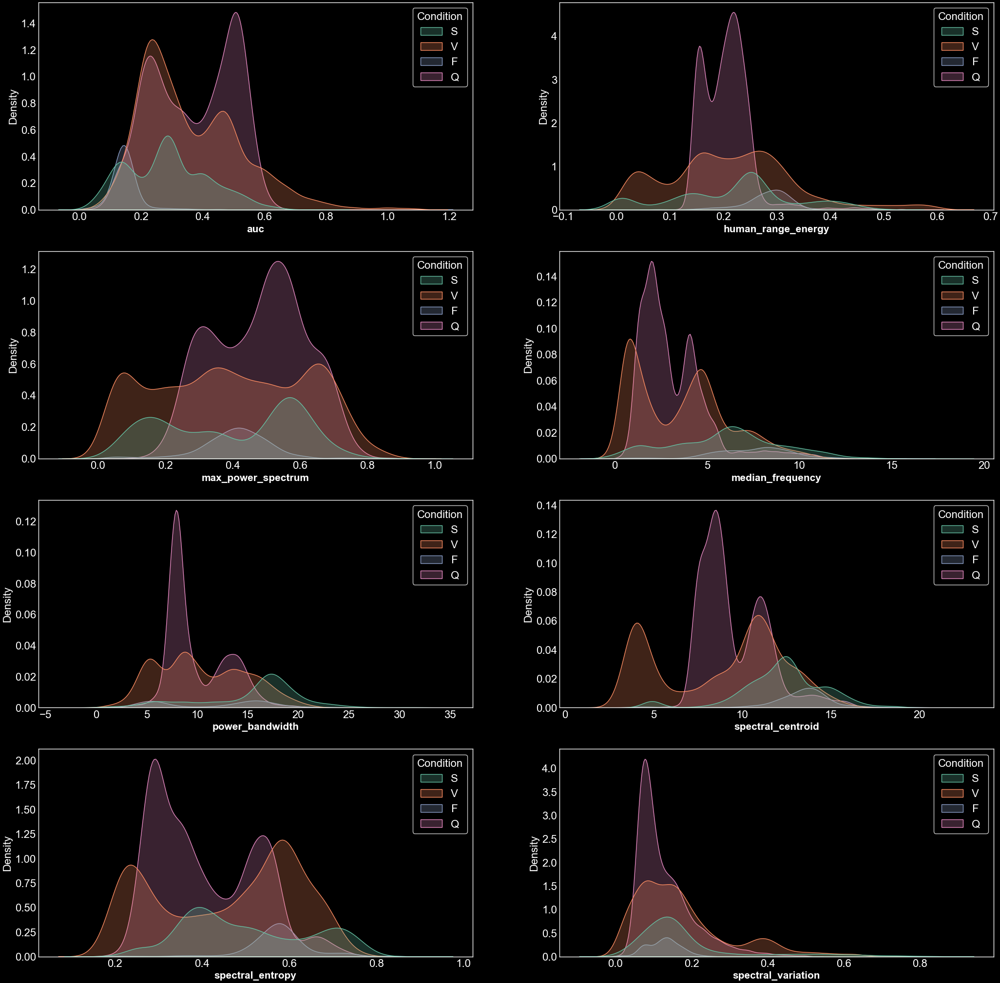

In [22]:
fig, ax = plt.subplots(4, 2, figsize = (20, 20))

for idx, feature in enumerate(further_investigation_features_math_sf):
    sns.kdeplot(data = feature_df.query("Condition != 'N'"), x = feature, hue = "Condition",  
                ax = ax.ravel()[idx], fill = True, palette="Set2")
    ax.ravel()[idx].set_xlabel(feature.replace("calc_", ""), fontsize = 15, fontweight = "bold")

The immediate features which have diffrent positioned peaks (or valleys) look to be:
- `spectral_entropy`
- `spectral_centroid`
- `power_bandwidth`
- `median_frequency`
- `auc`

These may turn out to be important features for the model as they have quite different structures in their distribution for different diseases.  

NOTE: We are not considering the height of the peaks as they may be due to the number of data points for each disease.

#### Now, let us see how the features are correlated with each other

In [23]:
feature_df[feature_math_sf].corr()

,auc,calc_centroid,fundamental_frequency,human_range_energy,max_frequency,max_power_spectrum,median_frequency,power_bandwidth,spectral_centroid,spectral_decrease,spectral_distance,spectral_entropy,spectral_skewness,spectral_kurtosis,spectral_variation,total_energy
auc,1.000000,0.315505,0.073339,-0.178032,-0.782869,0.116880,-0.839527,-0.209777,-0.867829,-0.939582,-0.932342,-0.641602,0.789739,0.742829,-0.018543,0.953965
calc_centroid,0.315505,1.000000,0.449658,-0.757279,-0.179351,-0.353293,-0.168442,0.175448,-0.199431,-0.426769,-0.176001,0.223879,0.172341,0.145113,0.523907,0.183613
fundamental_frequency,0.073339,0.449658,1.000000,-0.434308,-0.028924,-0.434646,0.011577,0.147590,0.004169,-0.191230,0.026274,0.272147,-0.012400,-0.010385,0.680924,0.006133
human_range_energy,-0.178032,-0.757279,-0.434308,1.000000,0.000649,0.702756,-0.120007,-0.408203,-0.079151,0.317876,-0.020054,-0.532681,0.058969,0.036778,-0.630788,-0.067894
max_frequency,-0.782869,-0.179351,-0.028924,0.000649,1.000000,-0.107379,0.735845,0.311173,0.898641,0.739635,0.811632,0.568946,-0.922254,-0.956668,0.106348,-0.833806
max_power_spectrum,0.116880,-0.353293,-0.434646,0.702756,-0.107379,1.000000,-0.331514,-0.392425,-0.279171,0.008253,-0.237326,-0.725933,0.208198,0.145521,-0.558109,0.138117
median_frequency,-0.839527,-0.168442,0.011577,-0.120007,0.735845,-0.331514,1.000000,0.466247,0.942628,0.768529,0.878402,0.792758,-0.840254,-0.725857,0.201078,-0.781456
power_bandwidth,-0.209777,0.175448,0.147590,-0.408203,0.311173,-0.392425,0.466247,1.000000,0.471023,0.097851,0.415743,0.423182,-0.532564,-0.436021,0.318724,-0.296047
spectral_centroid,-0.867829,-0.199431,0.004169,-0.079151,0.898641,-0.279171,0.942628,0.471023,1.000000,0.792329,0.924149,0.748079,-0.956130,-0.888975,0.177391,-0.858317
spectral_decrease,-0.939582,-0.426769,-0.191230,0.317876,0.739635,0.008253,0.768529,0.097851,0.792329,1.000000,0.782003,0.500657,-0.701191,-0.675005,-0.178576,-0.837626


<Axes: >

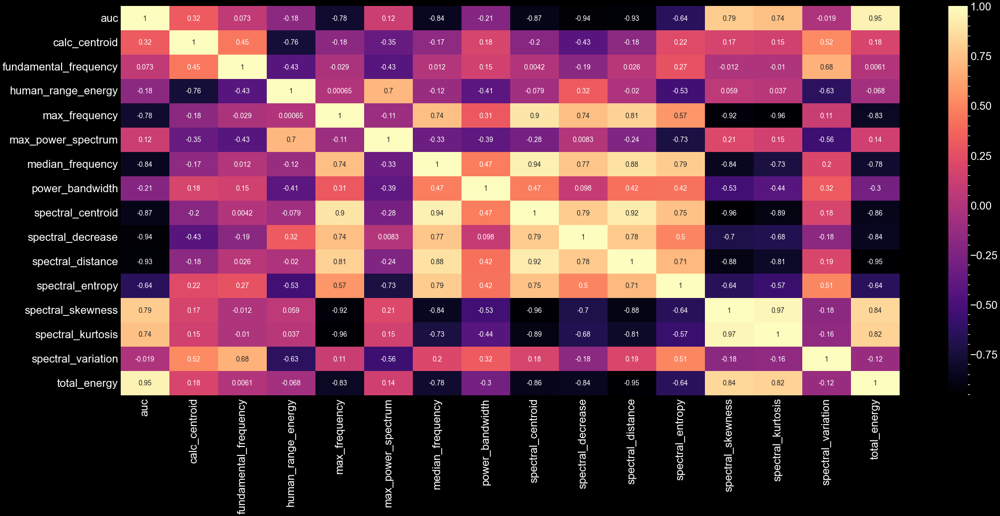

In [24]:
plt.figure(figsize=(20, 8))
sns.heatmap(feature_df[feature_math_sf].corr(), annot = True, cmap = "magma")

- There seem to be some features which are greatly correlated with each other. We may want to drop one of the such pairs of features.
- However, most of the features seem to be not greatly correlated due to the general darker shade of the plot.
- Let' see how much the features are correlated with each other.
- We will set the `threshold of high coorrelation = 0.8`

<Axes: title={'center': ' Features with correlation greater than 0.8 with other features'}>

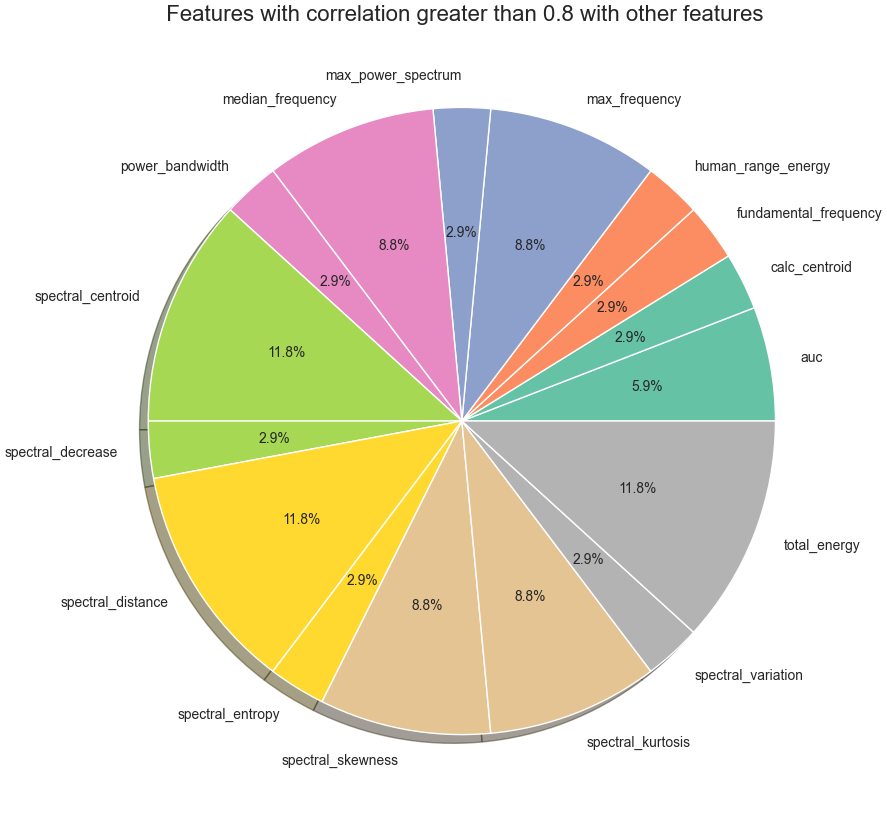

In [25]:
sns.set_style("darkgrid")
plt.figure(figsize = (15, 8))
(feature_df[feature_math_sf].corr() > 0.8).sum().plot(kind = "pie", 
                    title = " Features with correlation greater than 0.8 with other features", cmap = "Set2",
                    shadow = True, autopct = "%1.1f%%", fontsize=10)

- Looks like `total energy` and `spectral distance` have the greatest amount of correlation with other features.
- We may consider dropping them.

Let us see how the features compare to each other for each disease in a pair plot.  
However, as the data is huge, we will only use a `sample` of the data for this.

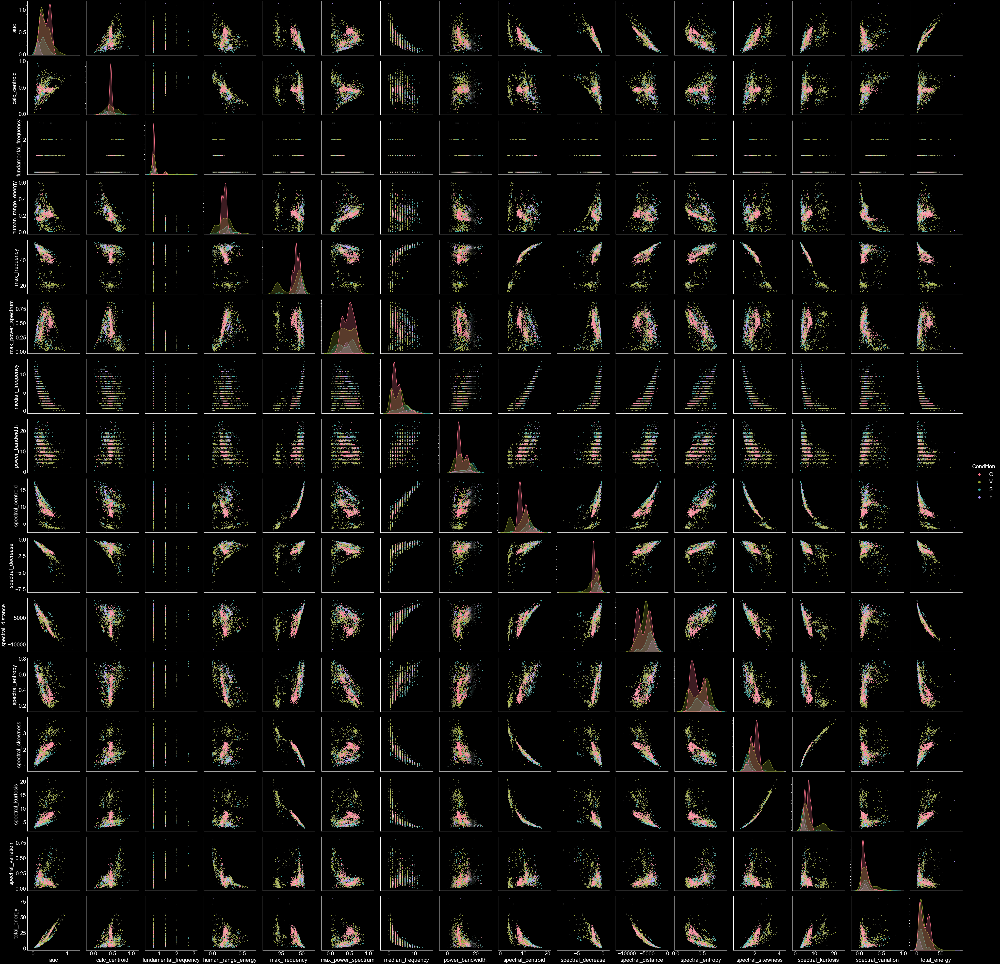

In [26]:
plt.style.use(["dark_background",  '_mpl-gallery-nogrid'])

frac_of_data = 0.1 # Fraction of data to be plotted

sns.pairplot(data = feature_df.query("Condition != 'N'")\
                .sample(frac=frac_of_data), 
                vars = feature_math_sf, hue = "Condition", kind = "scatter", diag_kind="kde", 
                plot_kws={"s": 4})

In [ ]:
feature_df.to_csv("feature_df.csv", index = False)

## Biological Features
---
- QRS Complex

<img src = "https://upload.wikimedia.org/wikipedia/commons/thumb/9/9e/SinusRhythmLabels.svg/1200px-SinusRhythmLabels.svg.png" width = 1000px height = 1000px>

Peaks of the signal are at index =  [18]


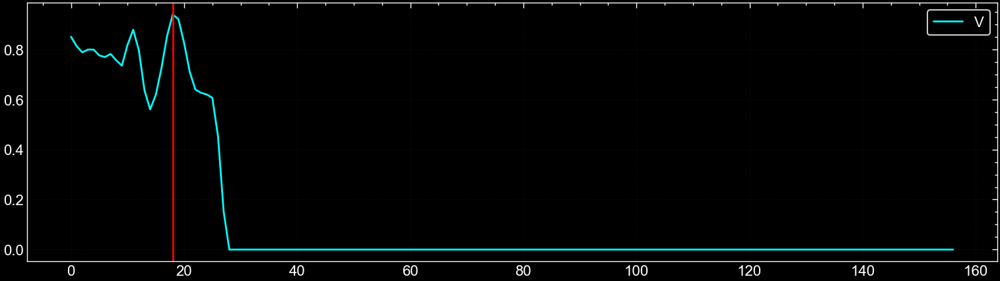

In [ ]:
plt.style.use(["science", "notebook", "grid"])
plt.figure(figsize=(15, 4))

ECG_NO = 80000

test_signal = target_filtered_data.loc[ECG_NO].values[30:]
plt.plot(test_signal, color = "cyan", label = filtered_data_final.Condition[ECG_NO])

peak, _ = find_peaks(x=test_signal, height = test_signal.max(), prominence=test_signal.max()/6, plateau_size=0.09)
print("Peaks of the signal are at index = ", peak)

if len(peak) == 1:
    plt.axvline(x=peak, color = "red", linewidth = 2)
plt.legend()

## Finding the R peak in all signals
- We will use a peak detection algorithm from `scipy.signal.find_peaks` to find the R peaks in all the signals.  
- We will vary the parameters of the function to obtain the best possible peaks and.  
- As there is only one R peak in all the ECGs, we should be getting a single value for the R peak for each signal.  
- We will reemove the ECGs for which we did not obtain a satisfactory result.

In [ ]:
PEAK_WINDOW = 30 # Number of samples to exclude from beginning of signal
PROMINENCE_OF_PEAK = 0.3
PLATEAU_SIZE = 0.1

peaks = target_filtered_data.iloc[:, PEAK_WINDOW:].apply(lambda x: find_peaks(x=x, 
                                                    height = x.max(), prominence=PROMINENCE_OF_PEAK,
                                                    plateau_size=0.05)[0], axis = 1)

In [ ]:
for idx, peak in enumerate(peaks):
    if len(peak) > 1:
        peaks[idx] = np.array([peak[-1]])


count1, count0, countelse = 0, 0, 0
for idx, val in enumerate(peaks):
    if len(val) == 1:
        count1 += 1
    if len(val) == 0:
        count0 += 1
    elif len(val) > 1:
        countelse += 1


print(f"Number of ECGs with single peak = {count1}")
print(f"Number of ECGs with no peak = {count0}")
print(f"Number of ECGs with more than one peak = {countelse}")

feature_df["R_peaks"] = peaks
 
# Replace list with single element with that element
# feature_df.R_peaks = filtered_data_final.R_peaks.apply(lambda y: y.item() if len(y)==1 else y)

# Replace empty list with NaN
# feature_df.R_peaks = filtered_data_final.R_peaks.apply(lambda y: np.nan if not isinstance(y, int) else y) 

Number of ECGs with single peak = 80776
Number of ECGs with no peak = 6778
Number of ECGs with more than one peak = 0


early_stopping=True,
l2_regularization=9.674948183980905e-09,
learning_rate=0.014247987845444413, loss='auto',
max_iter=512, max_leaf_nodes=55,
min_samples_leaf=164, n_iter_no_change=1,
random_state=1,
validation_fraction=0.11770489601182355,
warm_start=True)